In [ ]:
!pip install netket

In [ ]:
from tqdm import tqdm
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
import netket as nk
import numpy as np
import scipy.sparse as sp
import pandas as pd
from scipy.linalg import eigh, cholesky
from sklearn.manifold import TSNE
from scipy.interpolate import griddata
from sklearn.decomposition import PCA

L = 2
hxxz = nk.hilbert.Spin(s=1 / 2, N=L)

#  Define spin matrices in Hilbert space and the hamiltonian

In [ ]:
from netket.operator.spin import sigmax,sigmaz,sigmay
from netket.operator.boson import identity


def getSx(hxxz):
        return 1/2*sum(sigmax_i[i] for i in range(hxxz.size))
def getSy(hxxz):
        return 1/2*sum(sigmay_i[i] for i in range(hxxz.size))
def getSz(hxxz):
        return 1/2*sum(sigmaz_i[i] for i in range(hxxz.size))
def create_hamiltonian(hxxz, delta, hz, alpha):
    """
    Construct the XXZ Hamiltonian for L spins with anisotropy delta.

    Args:
        L (int): Number of spins.
        delta (float): Anisotropy parameter.
        h (float): transverse field

    Returns:
        np.ndarray: The XXZ Hamiltonian matrix.
    """
    # ensure first neighbour interactions
    L= hxxz.size
    H = np.zeros((2**L, 2**L), dtype=complex)


    for i in range(L):
      for j in range(i):
           J_ij = 1/abs(i-j)**alpha
           H += -J_ij* ( np.dot(sigmax_i[i], sigmax_i[j]) + np.dot(sigmay_i[i], sigmay_i[j]) + delta * np.dot(sigmaz_i[i], sigmaz_i[j]) )

      H += -hz*sigmaz_i[i]
    return H


# Define Gibbs state

In [ ]:
def get_Gibbs_state(H, T):
    """
    Construct the Gibbs state for the Hamiltonian H at finite temperature T

    Args:
        H (array): Hamiltonian
        T (float): Gibbs state temperature

    Returns:
        np.ndarray: The Gibbs state.
    """
    if T < 0:
        raise ValueError("Temperature T must be greater than zero.")

    # We go to Hamiltonian eigenbasis and construct the Gibbs state rho = exp^{-H/T}/Z, Z = \sum_{i} e^{-E_i/T}
    # H|v_i> = E_i|v_i>
    # H_diag = Diag[{E_i}] is diagonal Hamiltonian of the system in its eigenbasis
    # H_diag = P^dagger@H@P, where
    # P = [|v_0>, |v_1>, ..., |v_D>] - is a basis transformation matrix formed from eigenvectors {|v_i>} stored in a columns

    E, P = np.linalg.eigh(H)
    # Check basis transformation
    # H_diag = P.conj().T@H@P
    # H_     = P@H_diag@P.conj().T
    # print(np.allclose(H_,H))
    #

    # Let's shift partition function by E_0
    # Z = e^{-E_0/T} + sum_{i=1} e^{-E_i/T}
    # rho = e^{-E_0/T}|0><0| + sum_{i=1} e^{-(E_i-E_0)/T}|i><i|,
    # where |i>  is a vector of zeros, and 1 at i-ith position

    if(T == 0):
        Gibbs_weights = np.zeros((H.shape[0]))
        Gibbs_weights[0] = 1
        Z = np.sum(Gibbs_weights)
        rho_T_eigenbasis = np.diag(Gibbs_weights)/Z

    if(T>0):
        Gibbs_weights = np.exp(-E/T)
        Z = np.sum(Gibbs_weights)
        rho_T_eigenbasis = np.diag(Gibbs_weights)/Z

    rho_T = P @ rho_T_eigenbasis @ P.conj().T
    #print("Gibbs state in Pauli-Z eigenbasis")
    #print(rho_T)
    #print("Gibbs state in H eigenbasis")
    #print(rho_T_eigenbasis)
    #Verify properties of the Gibbs state
    #print("\nTrace of rho_T:", np.trace(rho_T).real)
    #print("Hermitian check (rho_T == rho_T^dagger):", np.allclose(rho_T, rho_T.conj().T))

    return rho_T_eigenbasis, rho_T

In [ ]:
H = np.array([[1, 0.5, 3], [0.5, 2, 3], [1, 2, 3]])
H = H+H.T

# Temperature for the Gibbs state
T = 0

# Compute Gibbs state
rho_T_eigenbasis, rho_T = get_Gibbs_state(H, T)

print("Gibbs state in H eigenbasis")
print(rho_T_eigenbasis)

print("Gibbs state in Pauli-Z eigenbasis")
print(rho_T)

print("\nTrace of rho_T:", np.trace(rho_T).real)
print("Hermitian check (rho_T == rho_T^dagger):", np.allclose(rho_T, rho_T.conj().T))



Gibbs state in H eigenbasis
[[1. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
Gibbs state in Pauli-Z eigenbasis
[[ 0.36240379  0.28657408 -0.3859308 ]
 [ 0.28657408  0.22661105 -0.30517827]
 [-0.3859308  -0.30517827  0.41098516]]

Trace of rho_T: 0.9999999999999999
Hermitian check (rho_T == rho_T^dagger): True


# Compute eigenvalues of hamiltonian, density matrix, Cholesky matrices and vectors, entropy and distance between states.


In [ ]:
def exact_ground_state(H):
    """
    Compute the ground state of a Hamiltonian via exact diagonalization.

    Args:
        H (np.ndarray): Hamiltonian matrix.

    Returns:
        tuple: Ground state wavefunction and its energy.
    """
    eigenvalues, eigenvectors = eigh(H)
    psi_0 = eigenvectors[:, 0]
    return psi_0,  eigenvalues[0:5]

def density_matrix(psi):
    """
    Construct the density matrix for a given state.

    Args:
        psi (np.ndarray): Wavefunction.

    Returns:
        np.ndarray: Density matrix.
    """
    return np.outer(psi, psi.conj())


def cholesky_matrix_to_cholesky_vector(A):
    """
    Extract the non-zero elements of the lower triangular part of a Cholesky matrix A
    (including the diagonal) into a vector.

    Args:
        A (np.ndarray): Cholesky matrix (assumed to be square and possibly complex).

    Returns:
        np.ndarray: Vector containing non-zero elements of the lower triangular part.
    """
    if not isinstance(A, np.ndarray):
        raise ValueError("Input must be a numpy array.")
    if A.shape[0] != A.shape[1]:
        raise ValueError("Input matrix must be square.")

    # Extract the lower triangular part
    A_LT = np.tril(A)

    # Select non-zero elements only. This method gives the indices of the elements of a squared matrix of dim A.shape[0] below the diagonal and on the diagonal.
    #It gives two array, one for the row index and the other one for the column index
    non_zero_indices = np.tril_indices(A.shape[0])
    L_real = np.real(A_LT[non_zero_indices])
    L_imag = np.imag(A_LT[non_zero_indices])

    # Concatenate real and imaginary parts
    return np.concatenate([L_real, L_imag])

def cholesky_vector_to_cholesky_matrix(vector):
    """
    Reconstruct a Cholesky matrix from a vector containing non-zero elements
    of its lower triangular part (including diagonal).

    Args:
        vector (np.ndarray): Flattened vector containing real and imaginary parts of non-zero elements.

    Returns:
        np.ndarray: Reconstructed Cholesky matrix, potentially complex.
    """
    # Determine the total number of elements in the lower triangular part
    num_elements = len(vector) // 2  # Each element has real and imaginary parts

    # Solve for n using the quadratic formula
    n = int((-1 + np.sqrt(1 + 8 * num_elements)) / 2)

    if n * (n + 1) // 2 != num_elements:
        raise ValueError("Invalid vector length: cannot correspond to a lower triangular matrix.")

    # Split the vector into real and imaginary parts
    half_length = len(vector) // 2
    L_real = vector[:half_length]
    L_imag = vector[half_length:]

    # Combine into a complex array if imaginary part exists
    L = L_real + 1j * L_imag

    # Initialize an empty matrix
    A = np.zeros((n, n), dtype=complex)

    # Fill in the lower triangular part
    tril_indices = np.tril_indices(n)
    A[tril_indices] = L

    return A

def get_entropy_bipartite(rho,L):
   """
    Gest the entropy of the bipartite system given by the half of the qubits of the system with density matrix rho.
    If the number of spins is odd, it will return the entropy of (L-1)/2 qubits.

    Args:
        L (int): Total number of qubits
        state (np.array): State of the system.

    Returns:
        the density matrix of the bipartite system and
        entropy (float): Entropy of the system composed by half the qubits.
    """


  ##Reshape the density matrix to perform the partial trace over half the qubits.
   shape=[2]*(2*L)
   #Init traced_rho variable
   rho=np.array(rho)
   reshaped_rho=rho.reshape(shape)
   traced_rho=reshaped_rho
   j=0
   for i in range((L+1)//2):
    #Trace the density matrix
    traced_rho= np.trace(traced_rho, axis1=0, axis2= L-i)
    j+=1
   re_reshaped=traced_rho.reshape(2**(L-j),2**(L-j))


   prob, eigv= np.linalg.eig(1/2*(re_reshaped+re_reshaped.conj()))
   prob = prob[prob > 0]
   return re_reshaped, -np.sum(np.abs(prob)*np.log2(np.abs(prob)))


def hilbert_schmidt_distance(rho1, rho2):
    """
    Calculate the Hilbert-Schmidt distance between two density matrices.

    Parameters:
        rho1 (numpy.ndarray): First density matrix.
        rho2 (numpy.ndarray): Second density matrix.

    Returns:
        float: The Hilbert-Schmidt distance.
    """
    # Ensure rho1 and rho2 are NumPy arrays
    rho1 = np.array(rho1)
    rho2 = np.array(rho2)

    # Compute the difference between the density matrices
    delta = rho1 - rho2

    # Compute the Hilbert-Schmidt distance
    distance = np.sqrt(np.trace(delta @ delta.conj().T).real)

    return distance

def trace_distance(rho_1, rho_2):
    delta = rho_1 - rho_2
    #rank = np.linalg.matrix_rank(delta)
    evals = np.linalg.eigvalsh(delta)

    d = 0
    for i in range(delta.shape[0]):
        d += np.abs(evals[i])
    return d/2


def get_distance(rho_1, rho_2):
    return hilbert_schmidt_distance(rho_1, rho_2)

def get_observable_string(observable):
    title_string = observable
    if(observable == 'E_0'):
        title_string = r"$E_0$"

    if(observable == 'Sz' or observable == 'Sz_decoded'):
        title_string = r"$\langle\hat{S}_z\rangle$"

    if(observable == 'Sx' or observable == 'Sx_decoded'):
        title_string = r"$\langle\hat{S}_x\rangle$"

    if(observable == 'Sx_var' or observable == 'Sx_var_decoded'):
        title_string = r"$\langle\Delta^2\hat{S}_x\rangle$"

    if(observable == 'Sz_var' or observable == 'Sx_var_decoded'):
        title_string = r"$\langle\Delta^2\hat{S}_z\rangle$"

    if(observable == 'SvN' or observable == 'SvN_decoded'):
        title_string = r"$S_{\rm vN}$"
    return title_string

In [ ]:
# Check if mapping: rho -> cholesky_matrix -> cholesky_vector
# is consistent with: cholesky_vector -> cholesky_matrix -> rho
L = 8
dim = 2**L
#Uniform distribution of 2**L numbers between 0 and 1
psi = np.random.rand((2**L)) + 0*1j
#Normalization
psi = psi/np.sqrt(np.sum(np.abs(psi)**2))

rho = np.outer(psi.conj(), psi)
epsilon = 1e-6
#Ensure positive definite
rho = (1-epsilon)*rho + epsilon*np.eye(dim)/dim

A = cholesky(rho, lower=True)
A_vec = cholesky_matrix_to_cholesky_vector(A)
A_ = cholesky_vector_to_cholesky_matrix(A_vec)
rho_ = A_@A_.conj().T/np.trace(A_@A_.conj().T)
print("Check if Cholesky decomposition and vectorization is consistent: ", np.allclose(rho, rho_))

Check if Cholesky decomposition and vectorization is consistent:  True



# Definition of training data


In [ ]:
L_values = [4]

#Define Pauli matrices


delta_values = np.arange(-1.0, 1.0, 0.025)
hz_values = np.arange(0, 3, 0.025)
alpha_values = np.array([0,3,6])


T_values = np.array([0])
for L in L_values:
    data = []
    dim = 2**L

    hxxz=nk.hilbert.Spin(s=1 / 2, N=L)
    sigmax_i= [ sigmax(hxxz,i).to_dense() for i in range(L)]
    sigmay_i= [ sigmay(hxxz,i).to_dense() for i in range(L)]
    sigmaz_i= [ sigmaz(hxxz,i).to_dense() for i in range(L)]

    Sx,Sy,Sz= getSx(hxxz), getSy(hxxz), getSz(hxxz)

    for alpha in alpha_values:

        for delta in tqdm(delta_values):
            for hz in hz_values:
                if(delta !=0 and hz !=0):
                    for T in T_values:
                        H = create_hamiltonian(hxxz, delta, hz, alpha)
                        rho_eigenbasis, rho = get_Gibbs_state(H, T)
                        epsilon = 1e-1
                        rho = (1-epsilon)*rho + epsilon*np.eye(dim)/dim
                        _, SvN = get_entropy_bipartite(rho,L)

                        A = cholesky(rho, lower=True)
                        A_vec = cholesky_matrix_to_cholesky_vector(A)

                        # Compute expectation values of total spin operators
                        E = np.trace(H @ rho).real
                        tempX=Sx@rho
                        tempY=Sy@rho
                        tempZ=Sz@rho

                        Sx_exp = np.trace(tempX).real
                        Sy_exp = np.trace(tempY).real
                        Sz_exp = np.trace(tempZ).real

                        Sx_var_exp = np.trace(Sx @ tempX).real - np.abs(Sx_exp)**2
                        Sy_var_exp = np.trace(Sy @ tempY).real - np.abs(Sy_exp)**2
                        Sz_var_exp = np.trace(Sz @ tempZ).real - np.abs(Sz_exp)**2



                        data.append({
                            "L"         : L,
                            "delta"     : delta,
                            "alpha"     : alpha,
                            "hz"        : hz,
                            "T"         : T,
                            "SvN"       : SvN,
                            "E"         : E,
                            "Sx"        : Sx_exp,
                            "Sy"        : Sy_exp,
                            "Sz"        : Sz_exp,
                            "Sx_var"    : Sx_var_exp,
                            "Sy_var"    : Sy_var_exp,
                            "Sz_var"    : Sz_var_exp,
                            "A_vec"     : A_vec,
                        })
        df_all = pd.DataFrame(data)

100%|██████████| 80/80 [00:06<00:00, 11.44it/s]


In [ ]:
#Seperate the data for each Hamiltonian
df_all_alpha0 = df_all[df_all["alpha"] == 0]
df_all_alpha3 = df_all[df_all["alpha"] == 3]
df_all_alpha6 = df_all[df_all["alpha"] == 6]

In [ ]:
df_all_alpha0


,L,delta,alpha,hz,T,SvN,E,Sx,Sy,Sz,Sx_var,Sy_var,Sz_var,A_vec
0,4,-1.000,0,0.025,0,1.436944,-9.000,6.319065e-19,0.0,0.0,2.8,2.8,0.10,"[0.07905694150420949, 0.0, 0.07905694150420949..."
1,4,-1.000,0,0.050,0,1.436944,-9.000,6.927347e-20,0.0,0.0,2.8,2.8,0.10,"[0.07905694150420949, 0.0, 0.07905694150420949..."
2,4,-1.000,0,0.075,0,1.436944,-9.000,3.456455e-18,0.0,0.0,2.8,2.8,0.10,"[0.07905694150420949, 0.0, 0.07905694150420949..."
3,4,-1.000,0,0.100,0,1.436944,-9.000,-3.566909e-19,0.0,0.0,2.8,2.8,0.10,"[0.07905694150420949, 0.0, 0.07905694150420949..."
4,4,-1.000,0,0.125,0,1.436944,-9.000,-1.456238e-18,0.0,0.0,2.8,2.8,0.10,"[0.07905694150420949, 0.0, 0.07905694150420949..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9515,4,0.975,0,2.875,0,0.503184,-15.615,0.000000e+00,0.0,1.8,1.0,1.0,0.46,"[0.9519716382329886, 0.0, 0.07905694150420949,..."
9516,4,0.975,0,2.900,0,0.503184,-15.705,0.000000e+00,0.0,1.8,1.0,1.0,0.46,"[0.9519716382329886, 0.0, 0.07905694150420949,..."
9517,4,0.975,0,2.925,0,0.503184,-15.795,0.000000e+00,0.0,1.8,1.0,1.0,0.46,"[0.9519716382329886, 0.0, 0.07905694150420949,..."
9518,4,0.975,0,2.950,0,0.503184,-15.885,0.000000e+00,0.0,1.8,1.0,1.0,0.46,"[0.9519716382329886, 0.0, 0.07905694150420949,..."


In [ ]:
# Set global font sizes
plt.rcParams.update({
    'font.size': 14,        # General font size
    'axes.titlesize': 16,   # Title font size
    'axes.labelsize': 14,   # X and Y labels font size
    'xtick.labelsize': 14,  # X-axis tick font size
    'ytick.labelsize': 14,  # Y-axis tick font size
    'legend.fontsize': 14,  # Legend font size
    'figure.titlesize': 18  # Figure title font size
})
cmap_string = 'viridis'

In [ ]:
def plot_phase_diagram(data, alpha):
    fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey = True, sharex = True)
    fig.suptitle("Phase diagram for XXZ Gibbs states at T = {:2.2f} and alpha  = {:2.2f}".format(T,alpha))
    ############


    observable = 'E'
    x = data["delta"]
    y = data["hz"]
    z = data['E']

    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')

    im1 = axes[0, 0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar1 = fig.colorbar(im1, ax=axes[0, 0], shrink=0.8)  # Shrink the colorbar
    cbar1.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar


    ############
    observable = 'SvN'
    x = data["delta"]
    y = data["hz"]
    z = data[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = axes[0,1].pcolormesh(X, Y, Z, cmap=cmap_string, vmin = 0, vmax = max(z), shading='auto')
    cbar3 = fig.colorbar(im3, ax=axes[0,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    ############
    observable = 'Sx'
    x = data["delta"]
    y = data["hz"]
    z = data[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im2 = axes[1, 0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar2 = fig.colorbar(im2, ax=axes[1, 0], shrink=0.8)  # Shrink the colorbar
    cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    ############
    observable = 'Sx_var'
    x = data["delta"]
    y = data["hz"]
    z = data[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im2 = axes[1, 1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar2 = fig.colorbar(im2, ax=axes[1, 1], shrink=0.8)  # Shrink the colorbar
    cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    ############
    observable = 'Sz'
    x = data["delta"]
    y = data["hz"]
    z = data[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im2 = axes[2, 0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar2 = fig.colorbar(im2, ax=axes[2, 0], shrink=0.8)  # Shrink the colorbar
    cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    ############
    observable = 'Sz_var'
    x = data["delta"]
    y = data["hz"]
    z = data[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im2 = axes[2, 1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar2 = fig.colorbar(im2, ax=axes[2, 1], shrink=0.8)  # Shrink the colorbar
    cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar


    axes[2,0].set_xlabel(r'$\Delta$')
    axes[2,1].set_xlabel(r'$\Delta$')

    axes[1,0].set_xlabel(r'$\Delta$')
    axes[1,1].set_xlabel(r'$\Delta$')
    axes[0,0].set_xlabel(r'$\Delta$')
    axes[0,1].set_xlabel(r'$\Delta$')

    axes[0,0].set_ylabel(r'$h_z$')
    axes[1,0].set_ylabel(r'$h_z$')
    axes[2,0].set_ylabel(r'$h_z$')

    axes[0,1].set_ylabel(r'$h_z$')
    axes[1,1].set_ylabel(r'$h_z$')
    axes[2,1].set_ylabel(r'$h_z$')

    for ax in axes.flat:
      ax.xaxis.set_tick_params(labelbottom=True)  # Show x numbers
      ax.yaxis.set_tick_params(labelbottom=True)  # Show y numbers

    plt.tight_layout()
    plt.savefig("fig0.png",dpi=600, format="png")
    plt.show()

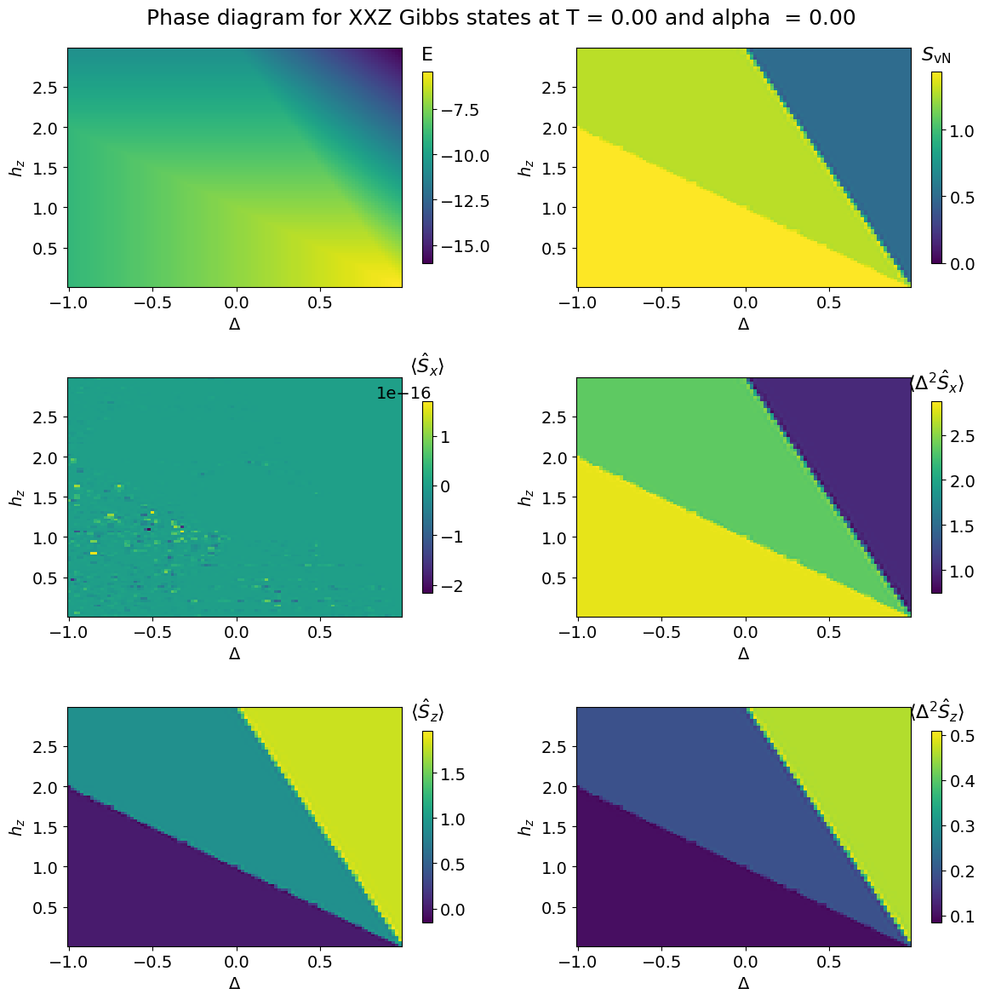

In [ ]:
plot_phase_diagram(df_all_alpha0, 0)

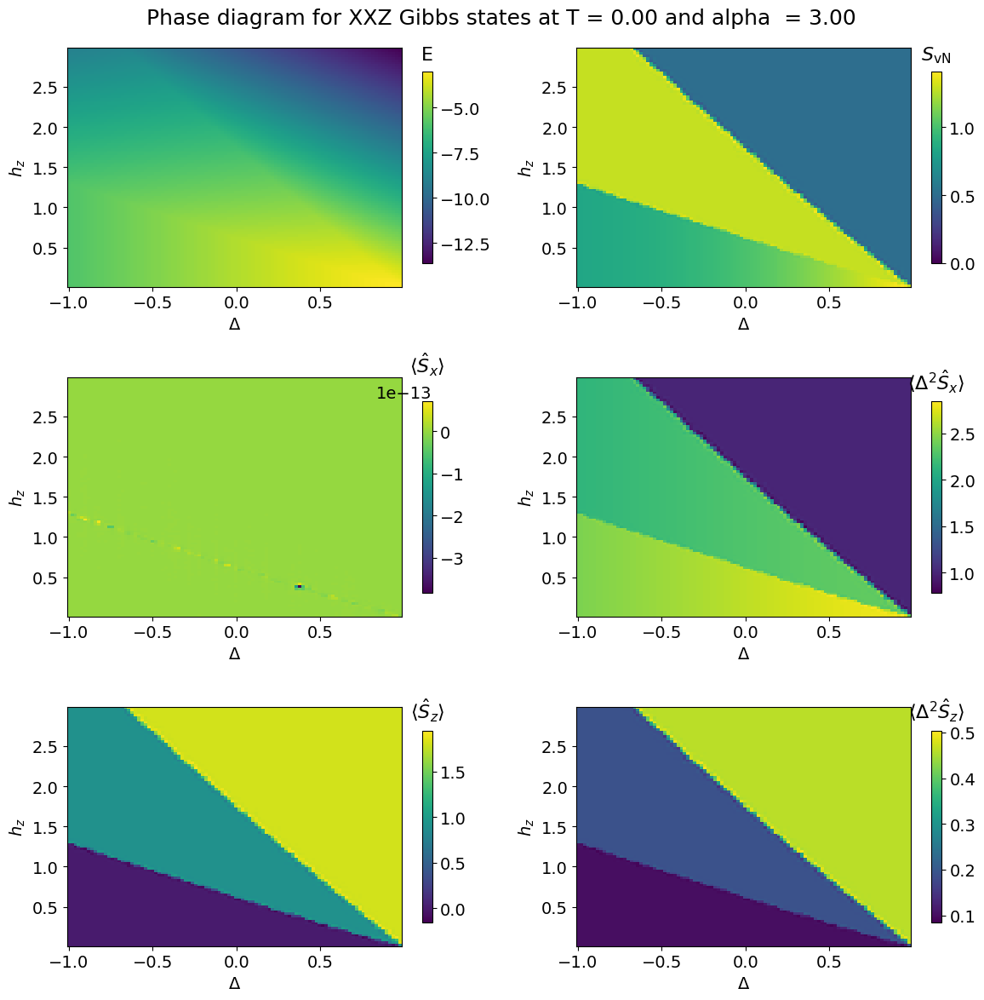

In [ ]:
plot_phase_diagram(df_all_alpha3, 3)

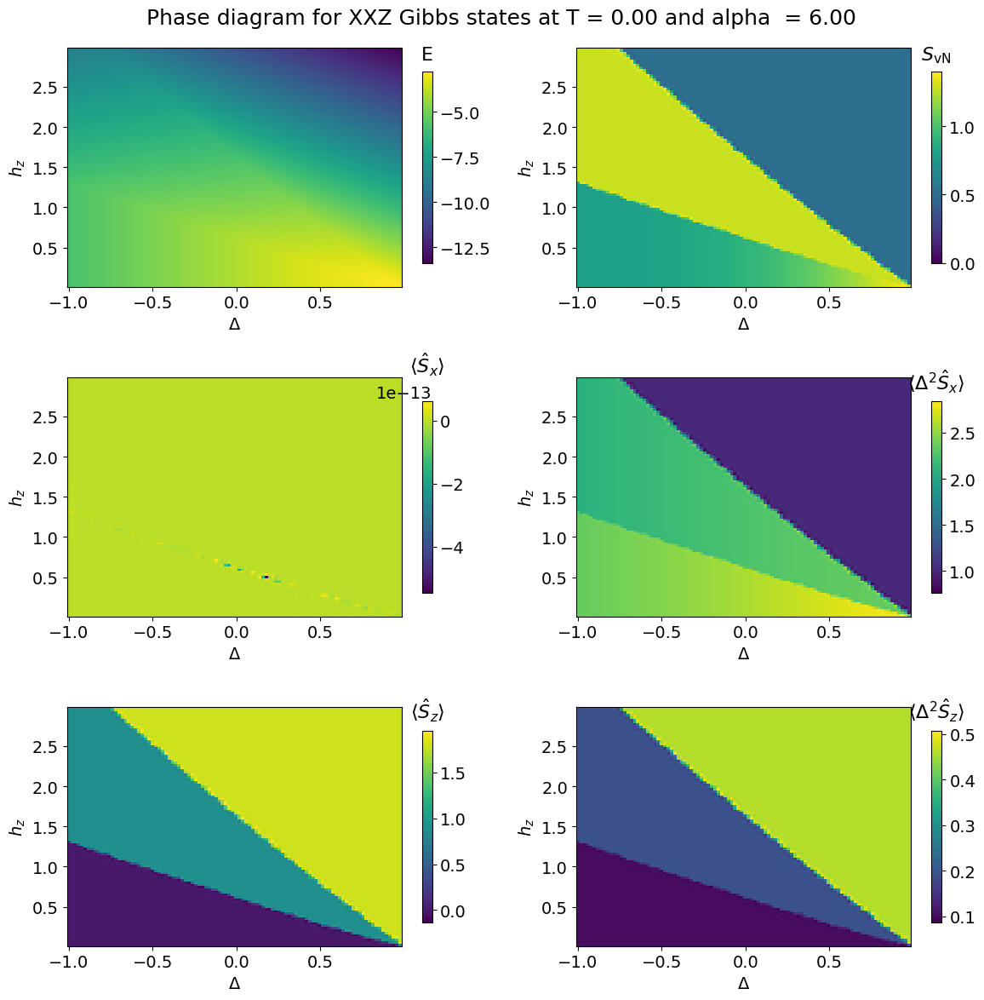

In [ ]:
plot_phase_diagram(df_all_alpha6, 6)

# Reduce dimensionality with PCA and t-SNE

We, we plot the result of reducing dimensionality of parameters and observe whether the points obtained are separated enough. Can we see different phases in the same clusters? Let´s see how it look with $S_z$

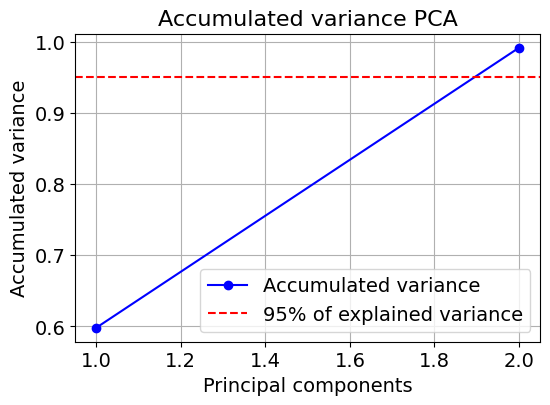

In [ ]:
vectors=np.stack(df_all_alpha6['A_vec'].values)
pca = PCA(n_components=2)
reduced_data=pca.fit_transform(vectors)
explained_variance_ratio = pca.explained_variance_ratio_
total_explained_variance = np.sum(explained_variance_ratio)

cumulative_variance = np.cumsum(explained_variance_ratio)

# Accumulated variance plot
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-', color='b', label="Accumulated variance")
plt.axhline(y=0.95, color='r', linestyle='--', label="95% of explained variance")
plt.xlabel('Principal components')
plt.ylabel('Accumulated variance')
plt.title('Accumulated variance PCA')
plt.legend()
plt.grid()
plt.show()

In [ ]:
def PCA_tSNE(data, alpha, is0=False):
    all_vectors = np.stack(data['A_vec'].values)
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(all_vectors)

    # Add PCA results to DataFrame
    data['PCA1'] = reduced_data[:, 0]
    data['PCA2'] = reduced_data[:, 1]

    all_vectors = np.stack(data['A_vec'].values)

    perplexity_vec = [80]
    for perplexity in perplexity_vec:
        if is0:
           tsne = TSNE(n_components=2, perplexity=perplexity, random_state=121)
           tsne_data = tsne.fit_transform(all_vectors)

        # Add t-SNE results to DataFrame
           data['tSNE1'] = tsne_data[:, 0]
           data['tSNE2'] = tsne_data[:, 1]


        observable = 'Sz'

        if is0:
            fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        else:
            fig, axes = plt.subplots(1, 2, figsize=(10, 4))
        fig.suptitle("Gibbs state phase diagram at T = {:2.2f} and alpha = {:2.2f}".format(T, alpha))
        # Subplot 1: PCA scatter plot
        sc1 = axes[0].scatter(data['PCA1'], data['PCA2'], c=data[observable], cmap=cmap_string, alpha=1)
        cbar1 = fig.colorbar(sc1, ax=axes[0], shrink=0.8)  # Shrink the colorbar
        cbar1.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

        axes[0].set_xlabel(r'$w_1$')
        axes[0].set_ylabel(r'$w_2$')
        axes[0].set_title('PCA')
        axes[0].grid(True)

        i=0
        if is0:
        # Subplot 2: t-SNE scatter plot
           sc2 = axes[1].scatter(data['tSNE1'], data['tSNE2'], c=data[observable], cmap=cmap_string, alpha=1)
           cbar2 = fig.colorbar(sc2, ax=axes[1], shrink=0.8)  # Shrink the colorbar
           cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
           i+=1
           axes[i].set_xlabel(r'$w_1$')
           axes[i].set_ylabel(r'$w_2$')

           axes[i].set_title('t-SNE | perplexity : {:d}'.format(perplexity))
           axes[i].grid(True)


        # Subplot 3: Colormap

        x = data["delta"]
        y = data["hz"]
        z = data[observable]

        # Create a structured grid
        grid_x = np.linspace(x.min(), x.max(), 100)
        grid_y = np.linspace(y.min(), y.max(), 100)
        X, Y = np.meshgrid(grid_x, grid_y)

        # Interpolate z values onto the grid
        Z = griddata((x, y), z, (X, Y), method='cubic')


        im3 = axes[i+1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
        cbar3 = fig.colorbar(im3, ax=axes[i+1], shrink=0.8)  # Shrink the colorbar
        cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

        #axes[2].set_xticks([-2, -1, 0, 1, 2])
        axes[i+1].set_xlabel(r'$\Delta$')
        axes[i+1].set_ylabel(r'$h_z$')

        plt.tight_layout()
        plt.savefig("fig1_perplexity.{:03d}_Sz_coloring.png".format(perplexity),dpi=600, format="png")
        plt.show()


        #############

        observable = 'SvN'


        if is0:
            fig, axes = plt.subplots(1, 3, figsize=(14, 4))
        else:
            fig, axes = plt.subplots(1, 2, figsize=(10, 4))
        # Subplot 1: PCA scatter plot
        sc1 = axes[0].scatter(data['PCA1'], data['PCA2'], c=data[observable], cmap=cmap_string, alpha=1)
        cbar1 = fig.colorbar(sc1, ax=axes[0], shrink=0.8)  # Shrink the colorbar
        cbar1.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

        axes[0].set_xlabel(r'$w_1$')
        axes[0].set_ylabel(r'$w_2$')
        axes[0].set_title('PCA')
        axes[0].grid(True)

        # Subplot 2: t-SNE scatter plot
        i=0
        if is0:
          sc2 = axes[1].scatter(data['tSNE1'], data['tSNE2'], c=data[observable], cmap=cmap_string, alpha=1)
          cbar2 = fig.colorbar(sc2, ax=axes[1], shrink=0.8)  # Shrink the colorbar
          cbar2.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
          i+=1
          axes[i].set_xlabel(r'$w_1$')
          axes[i].set_ylabel(r'$w_2$')
          axes[i].set_title('t-SNE | perplexity : {:d}'.format(perplexity))
          axes[i].grid(True)


        # Subplot 3: Colormap

        x = data["delta"]
        y = data["hz"]
        z = data[observable]

        # Create a structured grid
        grid_x = np.linspace(x.min(), x.max(), 100)
        grid_y = np.linspace(y.min(), y.max(), 100)
        X, Y = np.meshgrid(grid_x, grid_y)

        # Interpolate z values onto the grid
        Z = griddata((x, y), z, (X, Y), method='cubic')


        im3 = axes[i+1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
        cbar3 = fig.colorbar(im3, ax=axes[i+1], shrink=0.8)  # Shrink the colorbar
        cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

        #axes[2].set_xticks([-2, -1, 0, 1, 2])
        axes[i+1].set_xlabel(r'$\Delta$')
        axes[i+1].set_ylabel(r'$h_z$')

        plt.tight_layout()
        plt.savefig("fig1_perplexity.{:03d}_SvN_coloring.png".format(perplexity),dpi=600, format="png")
        plt.show()

<ipython-input-177-9802a87b098f>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-177-9802a87b098f>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]
<ipython-input-177-9802a87b098f>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

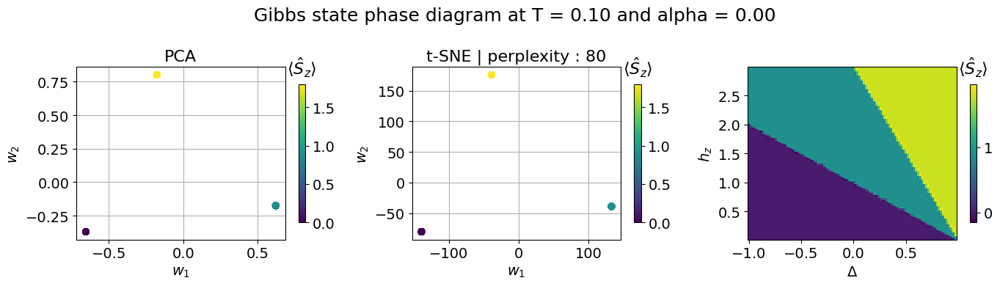

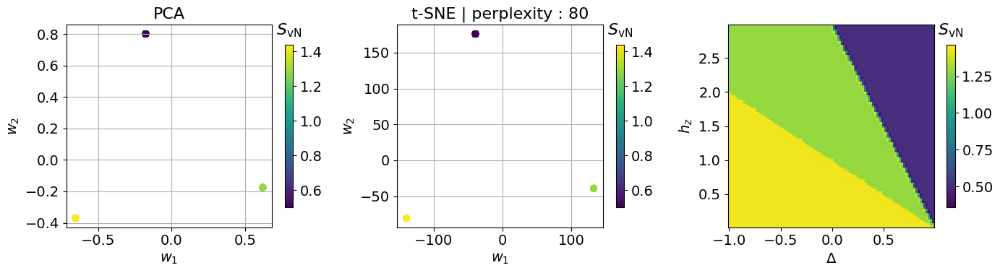

In [ ]:
PCA_tSNE(df_all_alpha0, 0,True)

<ipython-input-181-bbcc8de09ebe>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-181-bbcc8de09ebe>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]
<ipython-input-181-bbcc8de09ebe>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/

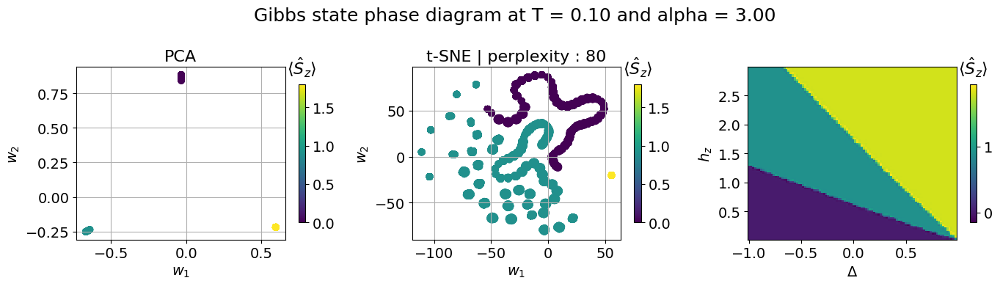

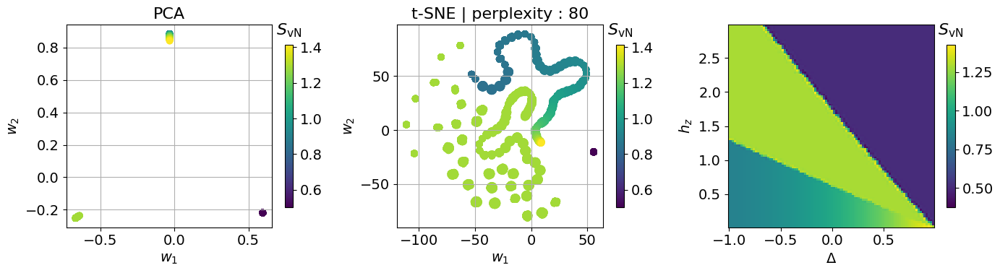

In [ ]:
PCA_tSNE(df_all_alpha3, 3,True)

<ipython-input-18-57d52fbfe412>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-18-57d52fbfe412>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]
<ipython-input-18-57d52fbfe412>:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/ind

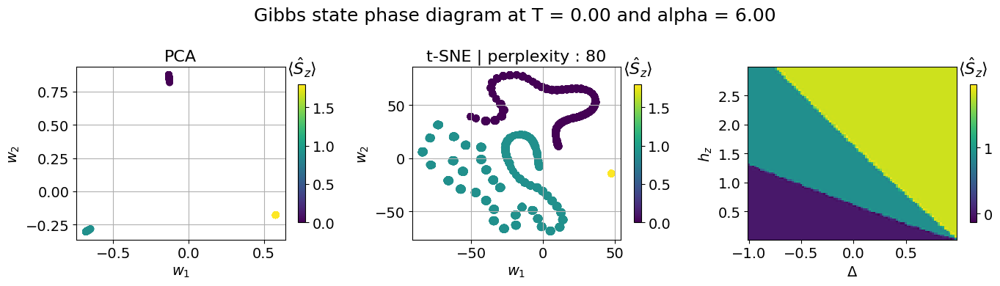

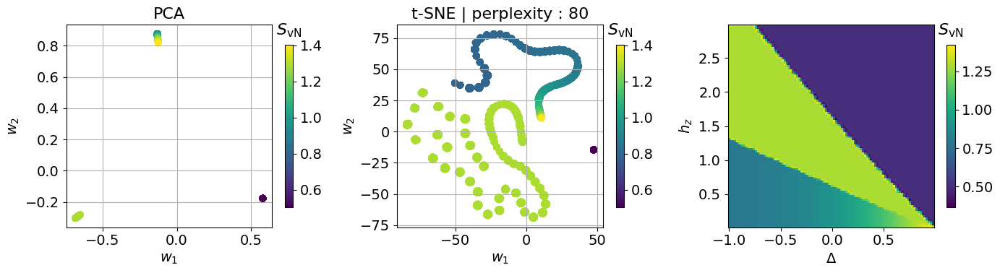

In [ ]:
PCA_tSNE(df_all_alpha6, 6)

## Autoencoder functions

In [ ]:
def configure_autoencoder(M,data):
    df_sample = data.sample(n=M, random_state=121)
    X = np.stack(df_sample['A_vec'].values)
    X_tensor = pt.tensor(X, dtype=pt.float32)
    # Dynamically set input_dim based on data shape
    input_dim = X_tensor.shape[1]
    hidden_dim1 = 200
    bottleneck=150
    return df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck

In [ ]:
import torch as pt

In [ ]:
class Autoencoder(pt.nn.Module):
    def __init__(self, input_dim, hidden_dim1,   bottleneck_dim):
        """
        Autoencoder with configurable bottleneck size, two hidden layers, and dropout.

        Parameters:
        - input_dim: Number of input features
        - hidden_dim1: Size of the first hidden layer
        - bottleneck_dim: Size of the bottleneck layer
        - dropout_prob: Dropout probability (default: 0.2)
        """
        super(Autoencoder, self).__init__()

        # Encoder: Two hidden layers + bottleneck
        self.encoder = pt.nn.Sequential(
            pt.nn.Linear(input_dim, hidden_dim1),
            pt.nn.ReLU(),
            pt.nn.Dropout(0.2),
            pt.nn.Linear(hidden_dim1, bottleneck_dim),
            pt.nn.LeakyReLU(0.3)
        )

        # Decoder: Reverse architecture of the encoder
        self.decoder = pt.nn.Sequential(
            pt.nn.Linear(bottleneck_dim, hidden_dim1),
            pt.nn.ReLU(),
            pt.nn.Dropout(0.2),
            pt.nn.Linear(hidden_dim1, input_dim),
            pt.nn.LeakyReLU(0.3)
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return encoded, decoded



# Train the autoencoder and reconstruct the diagrams with samples of data

---



In [ ]:
def train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, original_data):
    # Initialize model, loss, and optimizer
    model = Autoencoder(input_dim, hidden_dim1, bottleneck)
    criterion = pt.nn.MSELoss()
    optimizer = pt.optim.Adam(model.parameters(), lr=0.0001)

    # Print model structure for debugging
    print(model)

    # Training loop
    epochs = 100
    batch_size = 5
    dataset = pt.utils.data.TensorDataset(X_tensor)
    dataloader = pt.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

    print("Training the autoencoder...")
    for epoch in range(epochs):
        for batch in dataloader:
            inputs = batch[0]  # Get batch inputs

            # Ensure correct shape before forward pass
            if len(inputs.shape) == 1:  # If input is 1D, reshape to (1, num_features)
                inputs = inputs.unsqueeze(0)
            latent, outputs = model(inputs)
            loss = criterion(outputs, inputs)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
        if(epoch%10==0):
            print(f"Epoch [{epoch + 1}/{epochs}], Loss: {loss.item():.4f}")

    criterion = pt.nn.MSELoss(reduction='none')

    batch_size = 64
    df_all_decoded = []
    L=4
    with pt.no_grad():
        for start_idx in range(0, len(original_data), batch_size):
            batch = original_data.iloc[start_idx:start_idx + batch_size]
            A_vec_true = pt.tensor(np.stack(batch['A_vec']), dtype=pt.float32)

            # Pass batch through the model
            A_vec_latent, A_vec_decoded = model(A_vec_true)

            # Compute per-sample losses
            loss_per_sample = criterion(A_vec_decoded, A_vec_true).mean(dim=1)

            # Post-process each sample in the batch
            for idx, (vec_decoded,vec_true, vec_latent, true_loss) in enumerate(
                zip(A_vec_decoded,A_vec_true, A_vec_latent, loss_per_sample)
            ):
                vec_decoded_np = vec_decoded.numpy()
                vec_true_np = vec_true.numpy()
                A_true = cholesky_vector_to_cholesky_matrix(vec_true_np)
                A_decoded = cholesky_vector_to_cholesky_matrix(vec_decoded_np)
                rho_decoded = A_decoded @ A_decoded.conj().T / np.trace(A_decoded @ A_decoded.conj().T)
                _, SvN_decoded = get_entropy_bipartite(rho_decoded,L)

                rho= A_true @ A_true.conj().T / np.trace(A_true @ A_true.conj().T)

                tempX=Sx@rho_decoded
                tempY=Sy@rho_decoded
                tempZ=Sz@rho_decoded
                Sx_exp_decoded = np.trace(tempX).real
                Sy_exp_decoded = np.trace(tempY).real
                Sz_exp_decoded = np.trace(tempZ).real
                Sx_var_exp_decoded = np.trace(Sx @ tempX).real - np.abs(Sx_exp_decoded)**2
                Sy_var_exp_decoded = np.trace(Sy @ tempY).real - np.abs(Sy_exp_decoded)**2
                Sz_var_exp_decoded = np.trace(Sz @ tempZ).real - np.abs(Sz_exp_decoded)**2


                tr_distance = trace_distance(rho, rho_decoded)
                hs_distance = hilbert_schmidt_distance(rho, rho_decoded)

                row_decoded = batch.iloc[idx].to_dict()
                row_decoded.update({
                    'loss': true_loss.item(),
                    'A_vec_decoded'    : vec_decoded_np,
                    'A_vec_latent'     : vec_latent.numpy(),
                    'SvN_decoded'      : SvN_decoded,
                    'Sx_decoded'       : Sx_exp_decoded,
                    'Sy_decoded'       : Sy_exp_decoded,
                    'Sz_decoded'       : Sz_exp_decoded,
                    'Sx_var_decoded'   : Sx_var_exp_decoded,
                    'Sy_var_decoded'   : Sy_var_exp_decoded,
                    'Sz_var_decoded'   : Sz_var_exp_decoded,
                    'tr_distance'      : tr_distance,
                    'hs_distance'      : hs_distance,
                })
                df_all_decoded.append(row_decoded)

    df_all_decoded = pd.DataFrame(df_all_decoded)
    print("Done ...")
    return df_all_decoded



## Autoencoder results

## Plot

In [ ]:
def plot_autoencoder(df_all_decoded, df_sample, T, alpha, M):
    fig, ax = plt.subplots(2, 3, figsize=(16, 8), sharey = True, sharex = True)
    fig.suptitle("Phase diagram at T = {:2.2f}, α = {:2.0f}, M = {:3.0f} ".format(T, alpha, M))
    observable = 'Sz'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]

    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')

    im1 = ax[0,0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar1 = fig.colorbar(im1, ax=ax[0,0], shrink=0.8)  # Shrink the colorbar
    cbar1.ax.set_title(r"$\langle\hat{S}_z\rangle$", pad=10)  # Label on top of the colorbar

    # Plot the third heatmap (using the same data for demonstration)
    observable = 'loss'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[0,1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[0,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(r"loss", pad=10)  # Label on top of the colorbar

    # Plot the third heatmap (using the same data for demonstration)
    observable = 'Sz_decoded'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[0,2].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[0,2], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    observable = 'SvN'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]

    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')

    im1 = ax[1,0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar1 = fig.colorbar(im1, ax=ax[1,0], shrink=0.8)  # Shrink the colorbar
    cbar1.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    # Plot the third heatmap (using the same data for demonstration)
    observable = 'loss'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[1,1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[1,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(r"loss", pad=10)  # Label on top of the colorbar

    observable = 'SvN_decoded'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[1,2].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[1,2], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar

    ax[0,0].set_title("orig. phase diagram".format(T))
    ax[0,1].set_title("reconst. loss")
    ax[0,2].set_title("decoded phase diagram")
    ax[1,0].set_xlabel(r'$\Delta$')
    ax[1,1].set_xlabel(r'$\Delta$')
    ax[1,2].set_xlabel(r'$\Delta$')

    ax[0,0].set_ylabel(r'$h_z$')
    ax[1,0].set_ylabel(r'$h_z$')

    ax[0,0].scatter(df_sample["delta"], df_sample["hz"], color="black", s=50)
    ax[1,0].scatter(df_sample["delta"], df_sample["hz"], color="black", s=50)

    plt.tight_layout()
    plt.savefig("phase_diagram_reconstruction_loss.png", dpi=100, format="png")
    plt.show()

### Distance between states: Hilbert-Schmiddt distance and trace distance

In [ ]:
def distances(df_all_decoded, df_sample, T, alpha, M):
    fig, ax = plt.subplots(3, 2, figsize = (14, 16))

    fig.suptitle("Reconstruction quality at T = {:2.2f}, α = {:2.0f}, M = {:3.0f} ".format(T, alpha, M))

    observable = 'Sz'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[0,0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[0,0], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
    ax[0,0].set_xlabel(r'$\Delta$')

    observable = 'SvN'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[0,1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[0,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
    ax[0,1].set_xlabel(r'$\Delta$')
    ax[0,1].set_ylabel(r'$h_z$')

    observable = 'Sx_var'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[1,0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[1,0], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
    ax[1,0].set_xlabel(r'$\Delta$')


    observable = 'loss'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[2,0].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[2,0], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title(get_observable_string(observable), pad=10)  # Label on top of the colorbar
    ax[2,0].set_xlabel(r'$\Delta$')


    observable = 'tr_distance'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[1,1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[1,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title('trace\n   distance', pad=10)  # Label on top of the colorbar

    observable = 'hs_distance'
    x = df_all_decoded["delta"]
    y = df_all_decoded["hz"]
    z = df_all_decoded[observable]
    grid_x = np.linspace(x.min(), x.max(), 100)
    grid_y = np.linspace(y.min(), y.max(), 100)
    X, Y = np.meshgrid(grid_x, grid_y)
    Z = griddata((x, y), z, (X, Y), method='cubic')
    im3 = ax[2,1].pcolormesh(X, Y, Z, cmap=cmap_string, shading='auto')
    cbar3 = fig.colorbar(im3, ax=ax[2,1], shrink=0.8)  # Shrink the colorbar
    cbar3.ax.set_title('HS\n   distance', pad=10)  # Label on top of the colorbar

    for i in range(0,2):
        for j in range(0,3):
            ax[j,i].scatter(df_sample["delta"], df_sample["hz"], color="black", s=50)

            ax[j,i].set_xlabel(r'$\Delta$')
            ax[j,i].set_xlabel(r'$\Delta$')
            ax[j,i].set_ylabel(r'$h_z$')
            ax[j,i].set_ylabel(r'$h_z$')
    plt.savefig("phase_diagram_quantum_distance_temperature_T.{:2.2f}.png".format(T))
    plt.show()

 # Latent space representation

In [ ]:
def latent_repr(df_all_decoded, T, alpha, M):
    all_vectors = np.stack(df_all_decoded['A_vec_latent'])
    pca = PCA(n_components=2)
    reduced_data = pca.fit_transform(all_vectors)

    explained_variance_ratio = pca.explained_variance_ratio_
    total_explained_variance = np.sum(explained_variance_ratio)

    cumulative_variance = np.cumsum(explained_variance_ratio)

# Plot accumulated variance
    plt.figure(figsize=(6, 4))
    plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o', linestyle='-', color='b', label="Accumulated variance")
    plt.axhline(y=0.95, color='r', linestyle='--', label="95% of explained variance")
    plt.xlabel('Principal components')
    plt.ylabel('Accumulated variance')
    plt.title('Accumulated variance PCA')
    plt.legend()
    plt.grid()
    plt.show()

    # Add PCA results to DataFrame
    df_all_decoded['PCA1'] = reduced_data[:, 0]
    df_all_decoded['PCA2'] = reduced_data[:, 1]



    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle("Latent representation for T = {:2.2f}, α = {:2.0f}, M = {:3.0f} ".format(T, alpha, M))
    observable_1 = 'Sz'
    observable_2 = 'Sz_var'
    # Subplot 1: PCA scatter plot
    sc1 = axes[0].scatter(df_all_decoded['PCA1'], df_all_decoded['PCA2'], c=df_all_decoded[observable_1], cmap=cmap_string, alpha=1)
    cbar1 = fig.colorbar(sc1, ax=axes[0], shrink=0.8)  # Shrink the colorbar
    cbar1.ax.set_title(get_observable_string(observable_1), pad=10)  # Label on top of the colorbar

    # Subplot 1: PCA scatter plot
    sc1 = axes[1].scatter(df_all_decoded['PCA1'], df_all_decoded['PCA2'], c=df_all_decoded[observable_2], cmap=cmap_string, alpha=1)
    cbar1 = fig.colorbar(sc1, ax=axes[1], shrink=0.8)  # Shrink the colorbar
    cbar1.ax.set_title(get_observable_string(observable_2), pad=10)  # Label on top of the colorbar

    axes[0].set_xlabel(r'$w_1$')
    axes[1].set_xlabel(r'$w_1$')
    axes[0].set_ylabel(r'$w_2$')
    axes[0].set_title('PCA on latent representation'.format(T))
    axes[1].set_title('PCA on latent representation'.format(T))
    axes[0].grid(True)
    axes[1].grid(True)
    plt.savefig("fig2.png")
    plt.show()

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0050
Epoch [11/100], Loss: 0.0043
Epoch [21/100], Loss: 0.0037
Epoch [31/100], Loss: 0.0030
Epoch [41/100], Loss: 0.0024
Epoch [51/100], Loss: 0.0020
Epoch [61/100], Loss: 0.0019
Epoch [71/100], Loss: 0.0018
Epoch [81/100], Loss: 0.0014
Epoch [91/100], Loss: 0.0012
Done ...


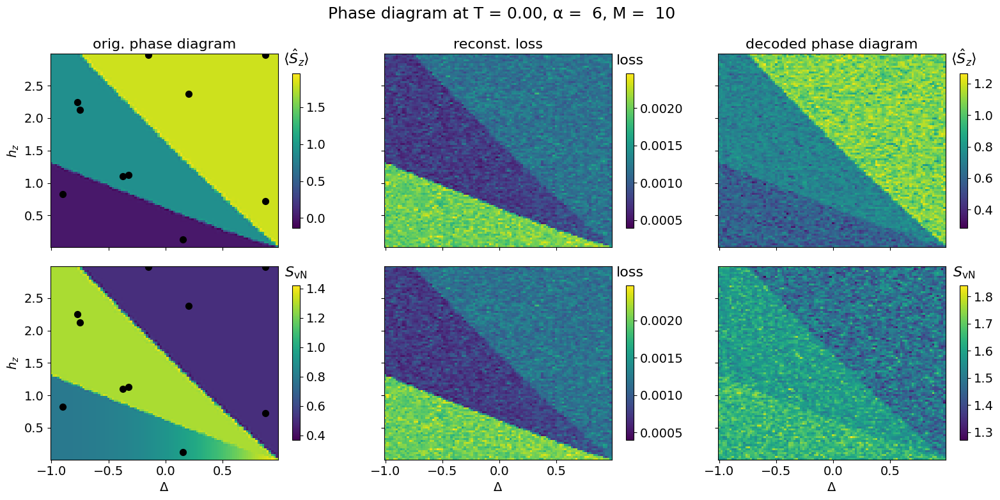

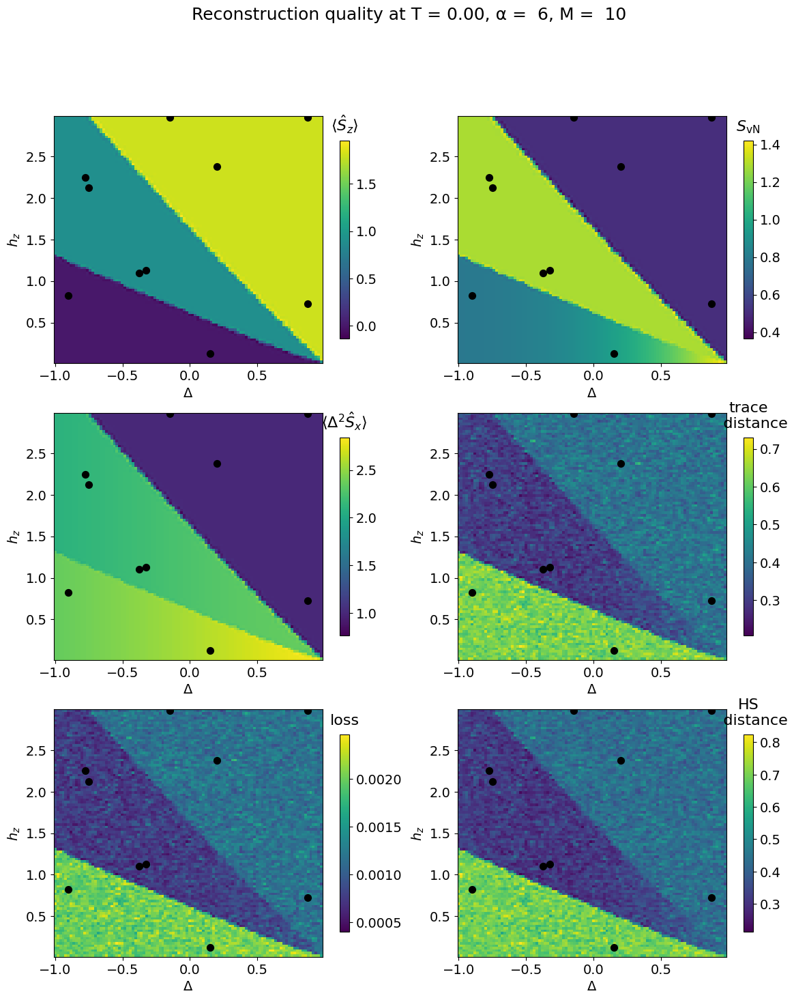

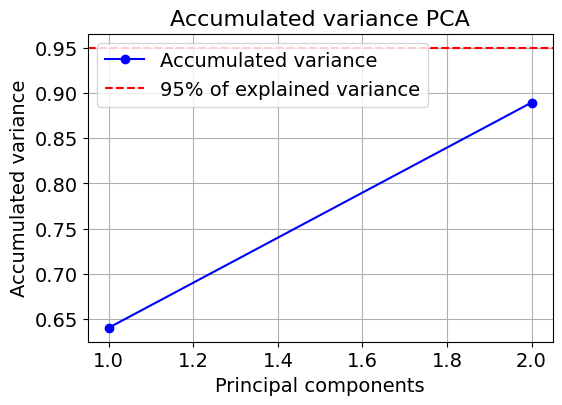

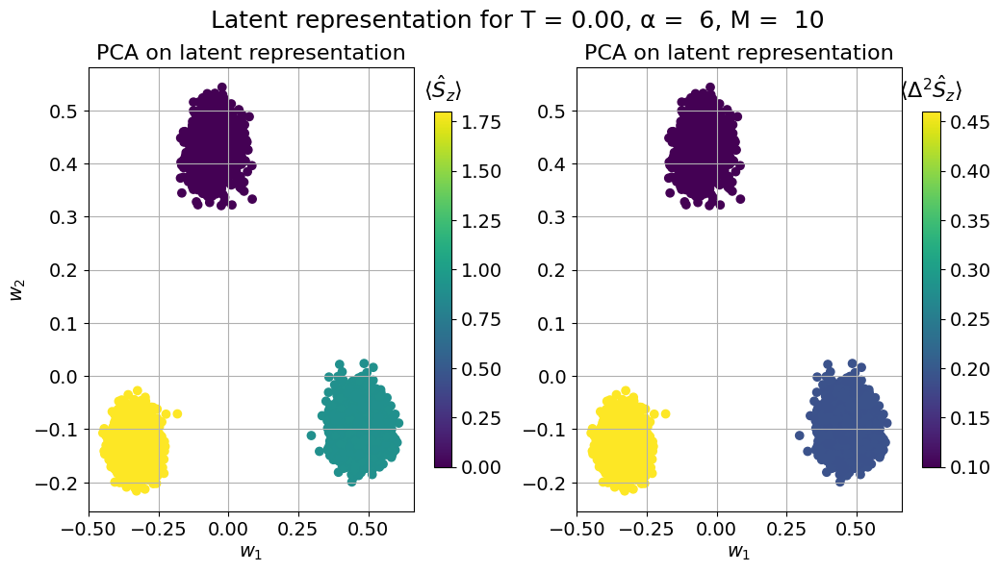

In [ ]:
#Sampling from full parameter space
M = 10
df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(M,df_all_alpha6)
df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_alpha6)
plot_autoencoder(df_all_decoded, df_sample, 0, 6, M)
distances(df_all_decoded, df_sample, 0, 6, M)
latent_repr(df_all_decoded, 0, 6, M)


# Sample with data from different ranges.

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0046
Epoch [11/100], Loss: 0.0039
Epoch [21/100], Loss: 0.0032
Epoch [31/100], Loss: 0.0025
Epoch [41/100], Loss: 0.0020
Epoch [51/100], Loss: 0.0014
Epoch [61/100], Loss: 0.0009
Epoch [71/100], Loss: 0.0005
Epoch [81/100], Loss: 0.0005
Epoch [91/100], Loss: 0.0005
Done ...


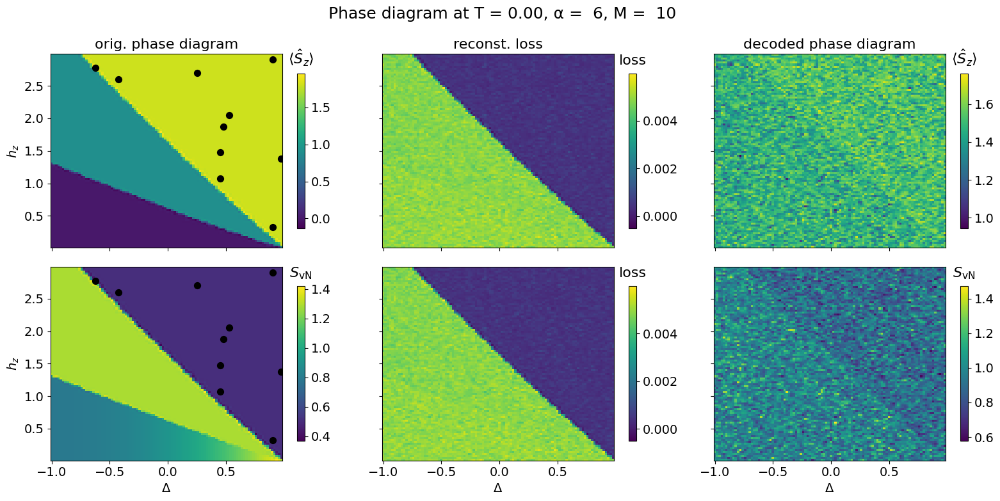

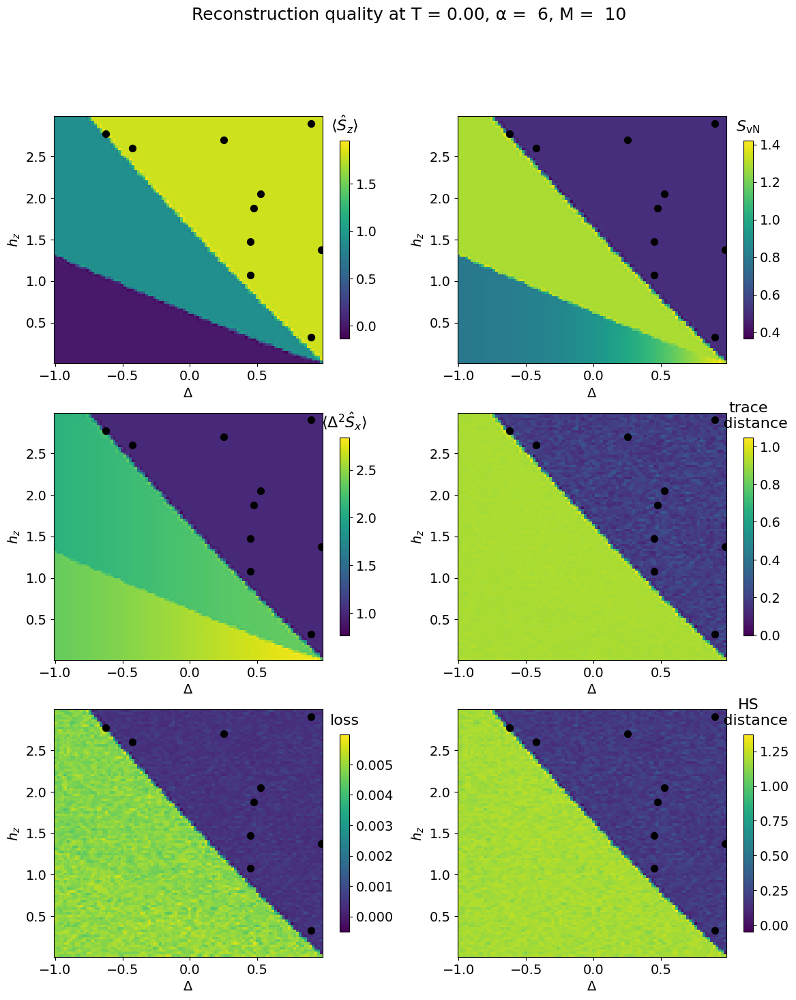

(9520, 150)


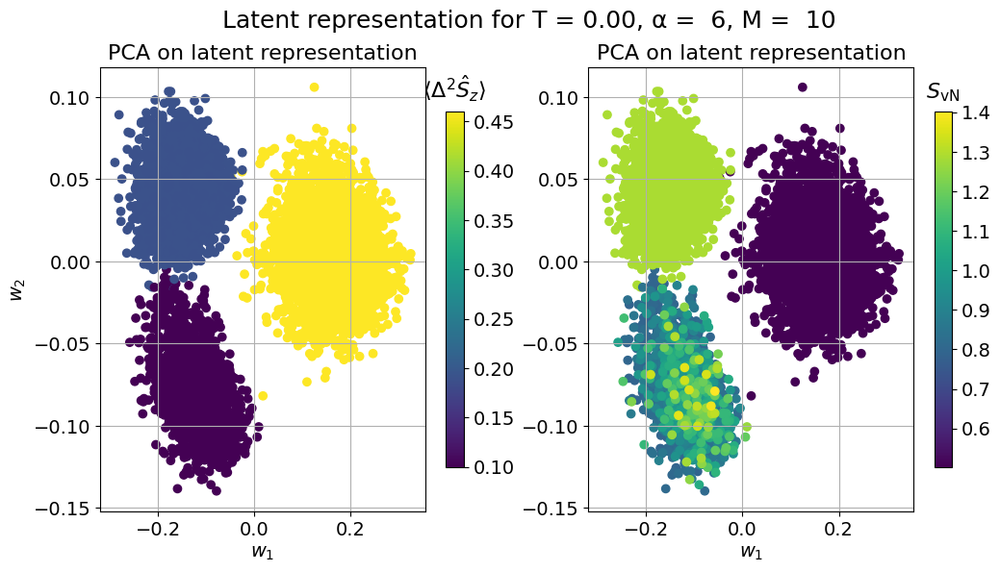

       L  delta  alpha     hz  T       SvN          E   Sx   Sy   Sz  Sx_var  \
20466  4 -0.725      6  2.950  0  0.503184  -8.641214  0.0  0.0  1.8     1.0   
20467  4 -0.725      6  2.975  0  0.503184  -8.731214  0.0  0.0  1.8     1.0   
20583  4 -0.700      6  2.900  0  0.503184  -8.529448  0.0  0.0  1.8     1.0   
20584  4 -0.700      6  2.925  0  0.503184  -8.619448  0.0  0.0  1.8     1.0   
20585  4 -0.700      6  2.950  0  0.503184  -8.709448  0.0  0.0  1.8     1.0   
...   ..    ...    ...    ... ..       ...        ...  ...  ...  ...     ...   
28555  4  0.975      6  2.875  0  0.503184 -13.011126  0.0  0.0  1.8     1.0   
28556  4  0.975      6  2.900  0  0.503184 -13.101126  0.0  0.0  1.8     1.0   
28557  4  0.975      6  2.925  0  0.503184 -13.191126  0.0  0.0  1.8     1.0   
28558  4  0.975      6  2.950  0  0.503184 -13.281126  0.0  0.0  1.8     1.0   
28559  4  0.975      6  2.975  0  0.503184 -13.371126  0.0  0.0  1.8     1.0   

       Sy_var  Sz_var                  

In [ ]:
#For subset of training data (constant Sz)
df_all_sz15 = df_all_alpha6[(df_all_alpha6["Sz"] >= 1.5) & (df_all_alpha6["Sz"] <= 2.0)]
M = 10
df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(M,df_all_sz15)
df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_alpha6)
plot_autoencoder(df_all_decoded, df_sample, 0, 6, M)
distances(df_all_decoded, df_sample, 0, 6, M)
latent_repr(df_all_decoded, 0, 6, M)

print(df_all_sz15)
print(df_all_alpha6)




# Change number of samples

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0045
Epoch [11/100], Loss: 0.0038
Epoch [21/100], Loss: 0.0035
Epoch [31/100], Loss: 0.0032
Epoch [41/100], Loss: 0.0027
Epoch [51/100], Loss: 0.0024
Epoch [61/100], Loss: 0.0021
Epoch [71/100], Loss: 0.0019
Epoch [81/100], Loss: 0.0013
Epoch [91/100], Loss: 0.0011
Done ...


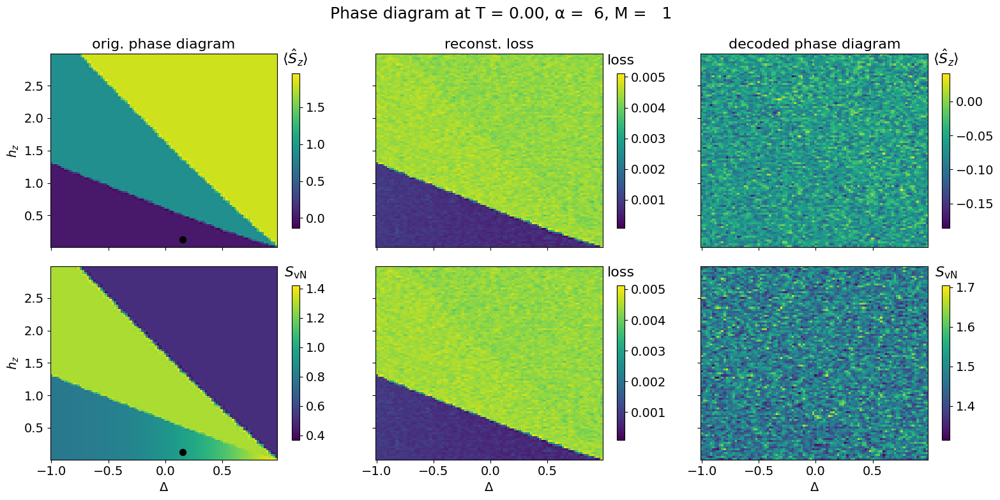

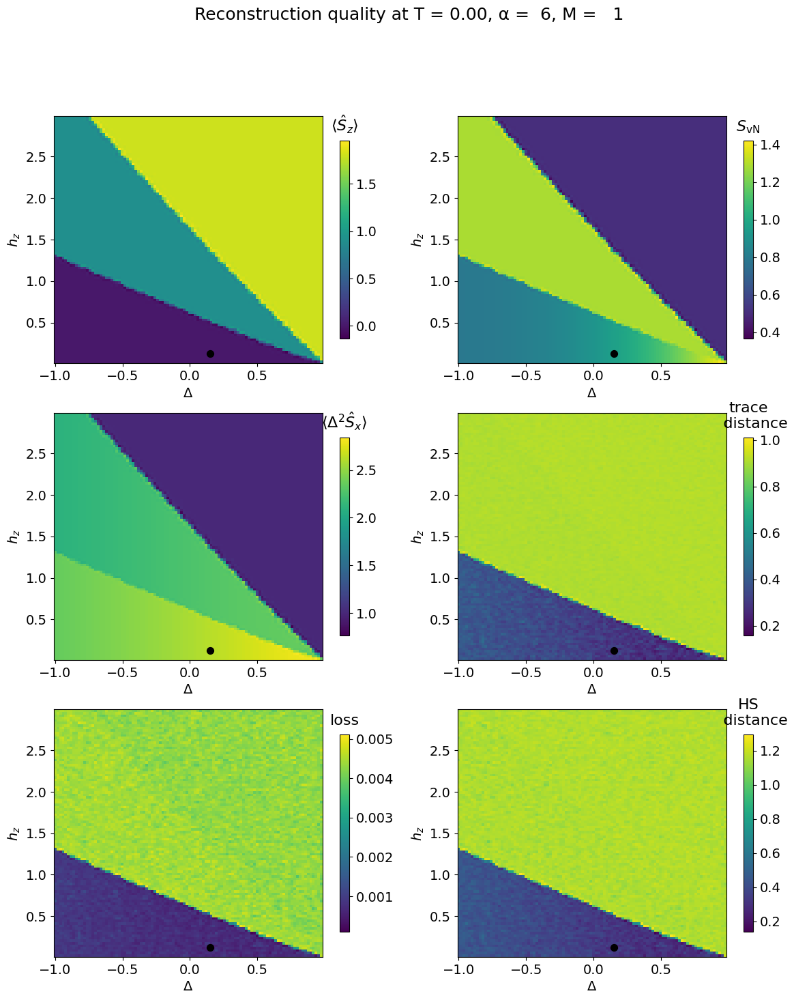

(9520, 150)


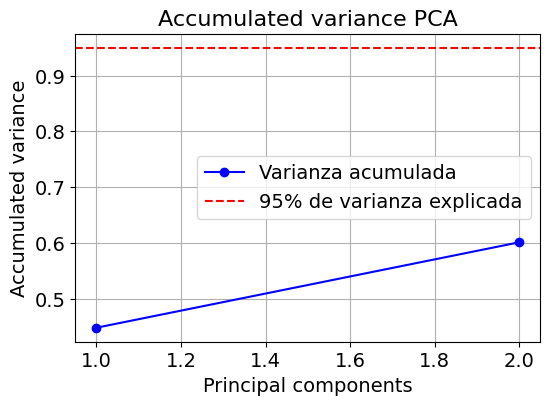

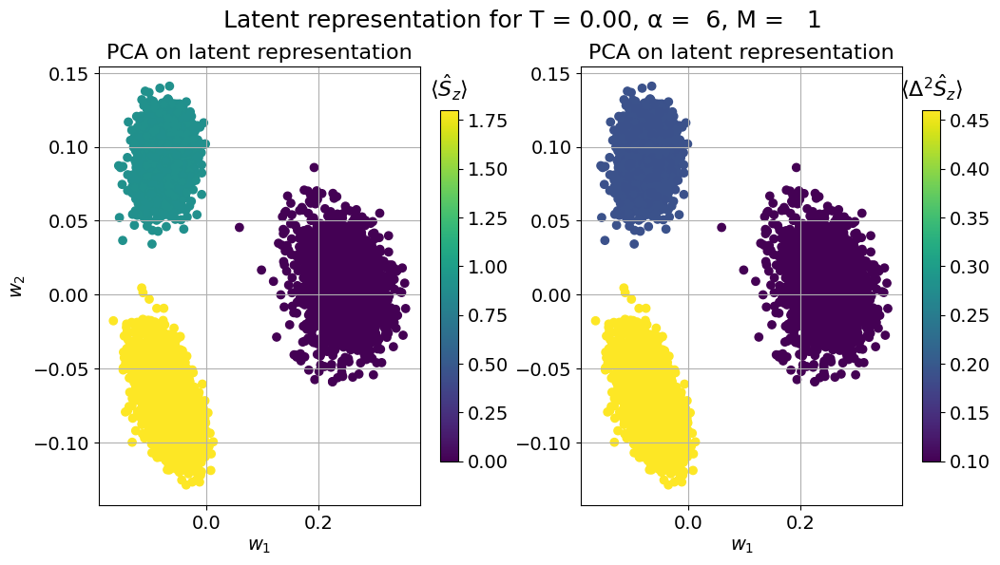

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0047
Epoch [11/100], Loss: 0.0042
Epoch [21/100], Loss: 0.0039
Epoch [31/100], Loss: 0.0035
Epoch [41/100], Loss: 0.0031
Epoch [51/100], Loss: 0.0028
Epoch [61/100], Loss: 0.0022
Epoch [71/100], Loss: 0.0018
Epoch [81/100], Loss: 0.0017
Epoch [91/100], Loss: 0.0013
Done ...


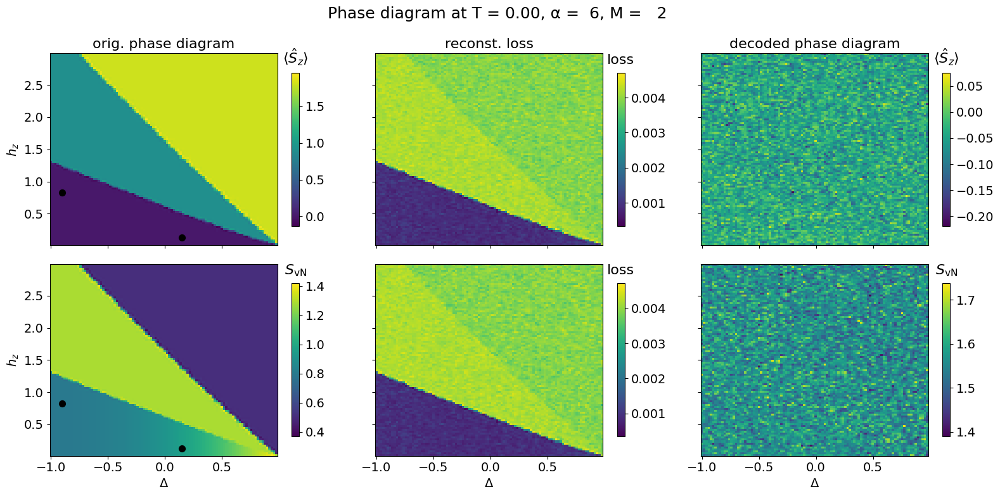

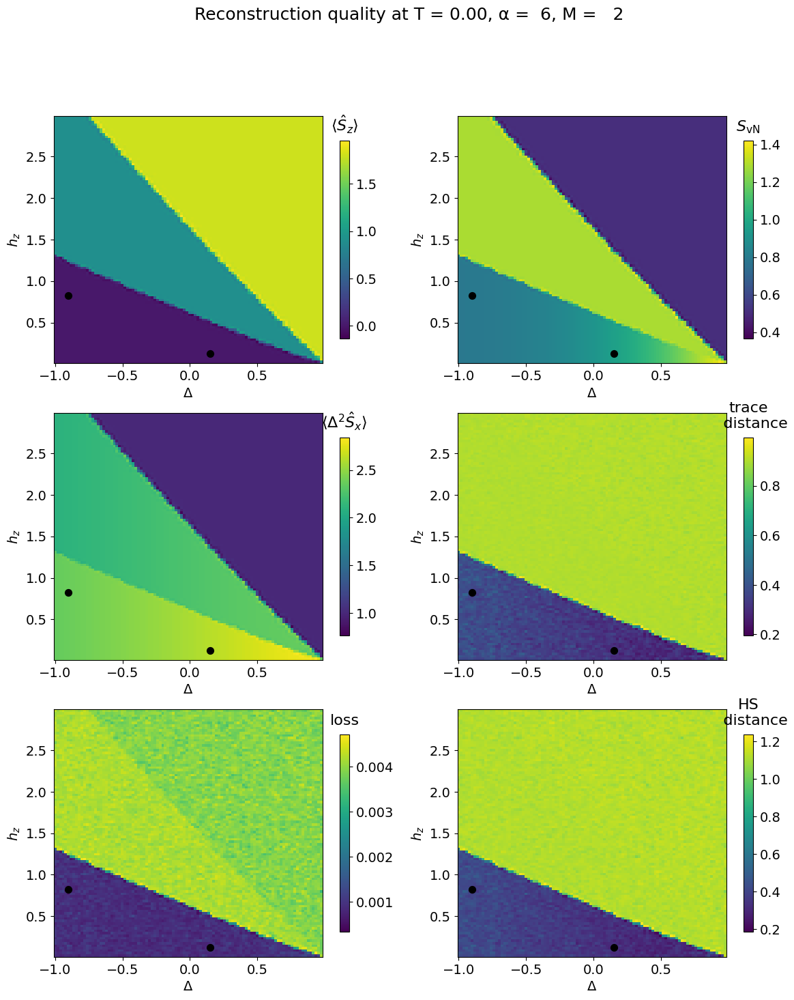

(9520, 150)


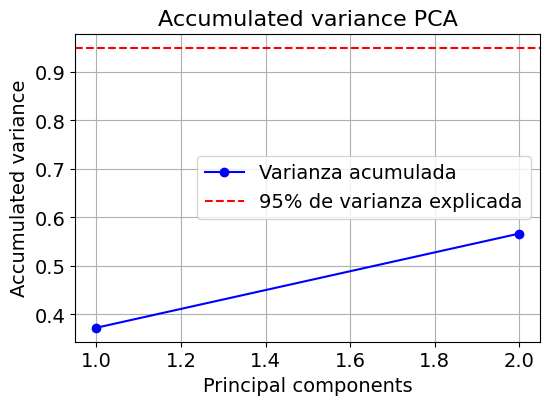

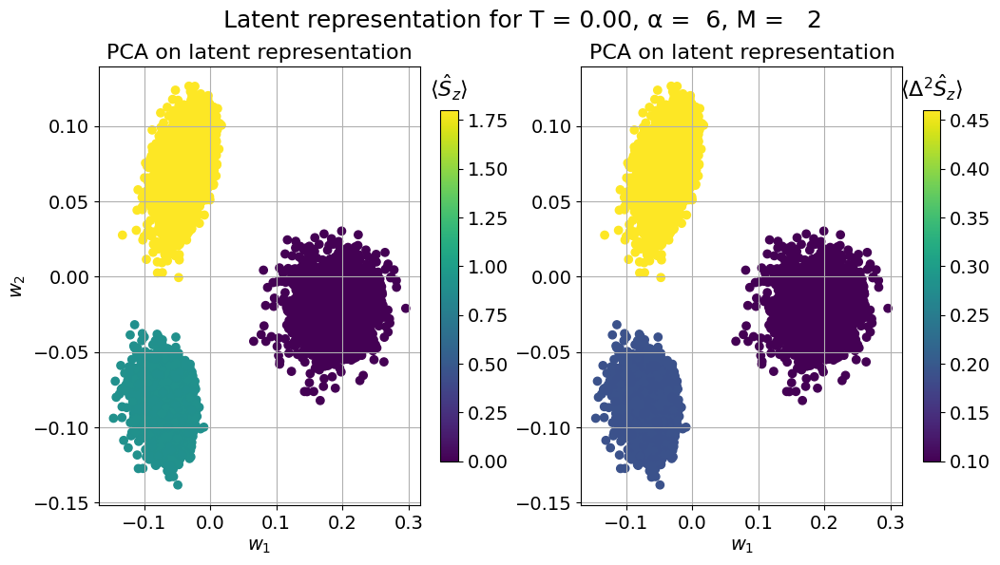

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0045
Epoch [11/100], Loss: 0.0038
Epoch [21/100], Loss: 0.0033
Epoch [31/100], Loss: 0.0028
Epoch [41/100], Loss: 0.0024
Epoch [51/100], Loss: 0.0020
Epoch [61/100], Loss: 0.0019
Epoch [71/100], Loss: 0.0017
Epoch [81/100], Loss: 0.0012
Epoch [91/100], Loss: 0.0013
Done ...


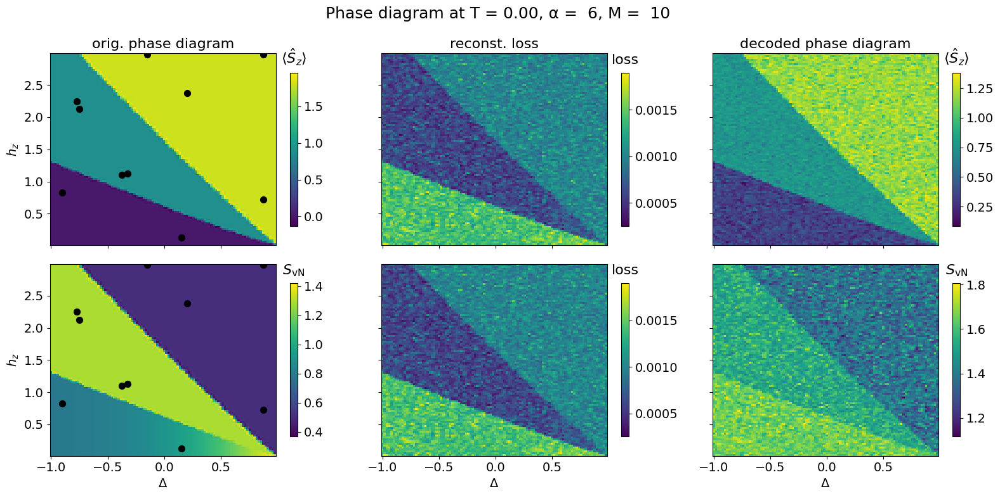

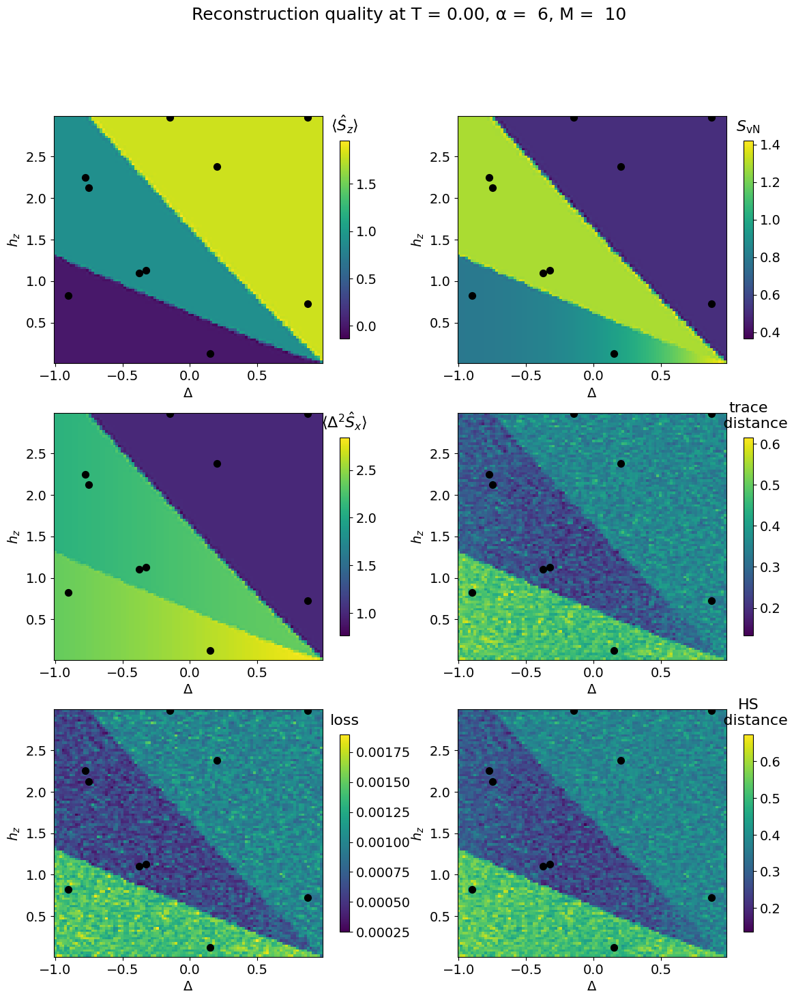

(9520, 150)


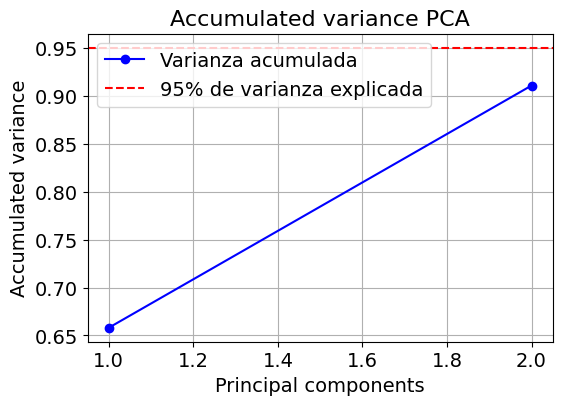

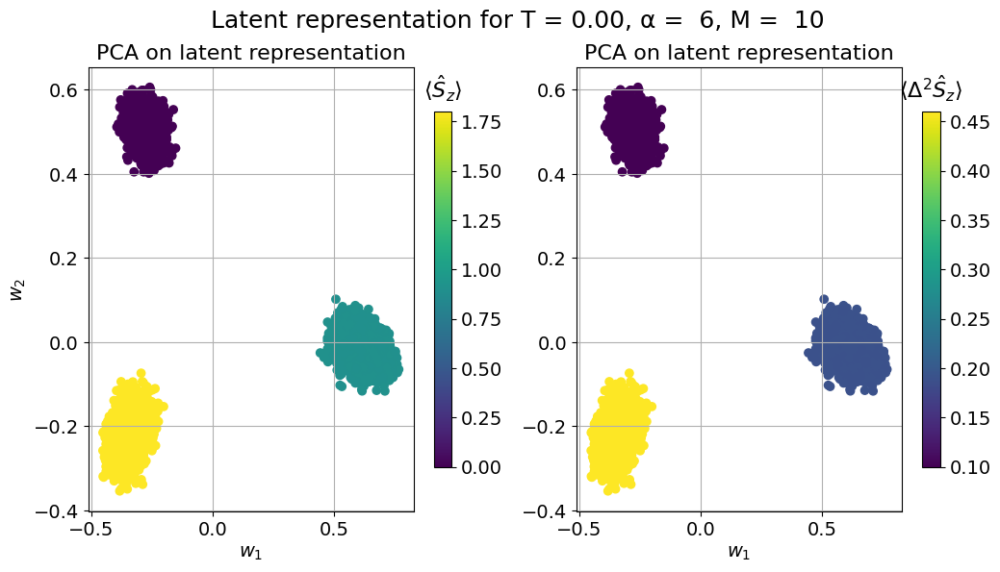

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0045
Epoch [11/100], Loss: 0.0032
Epoch [21/100], Loss: 0.0021
Epoch [31/100], Loss: 0.0020
Epoch [41/100], Loss: 0.0013
Epoch [51/100], Loss: 0.0009
Epoch [61/100], Loss: 0.0005
Epoch [71/100], Loss: 0.0003
Epoch [81/100], Loss: 0.0003
Epoch [91/100], Loss: 0.0005
Done ...


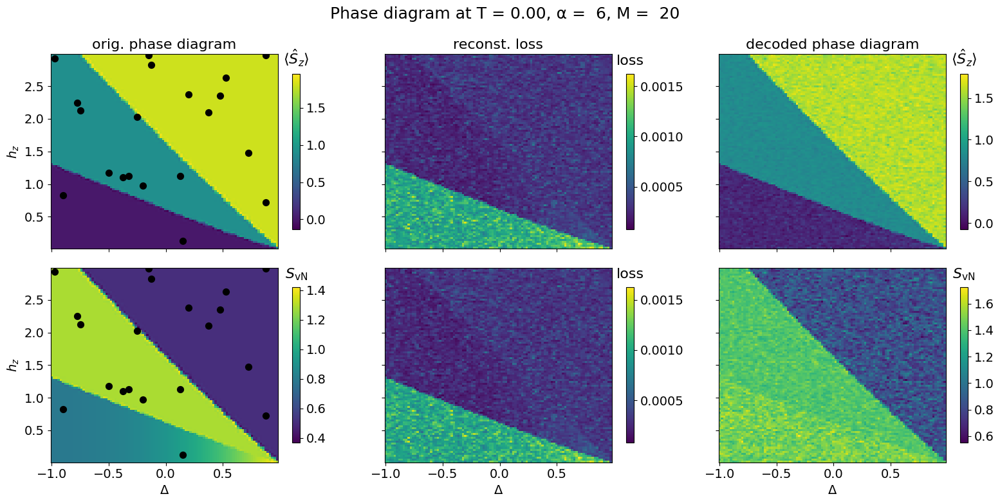

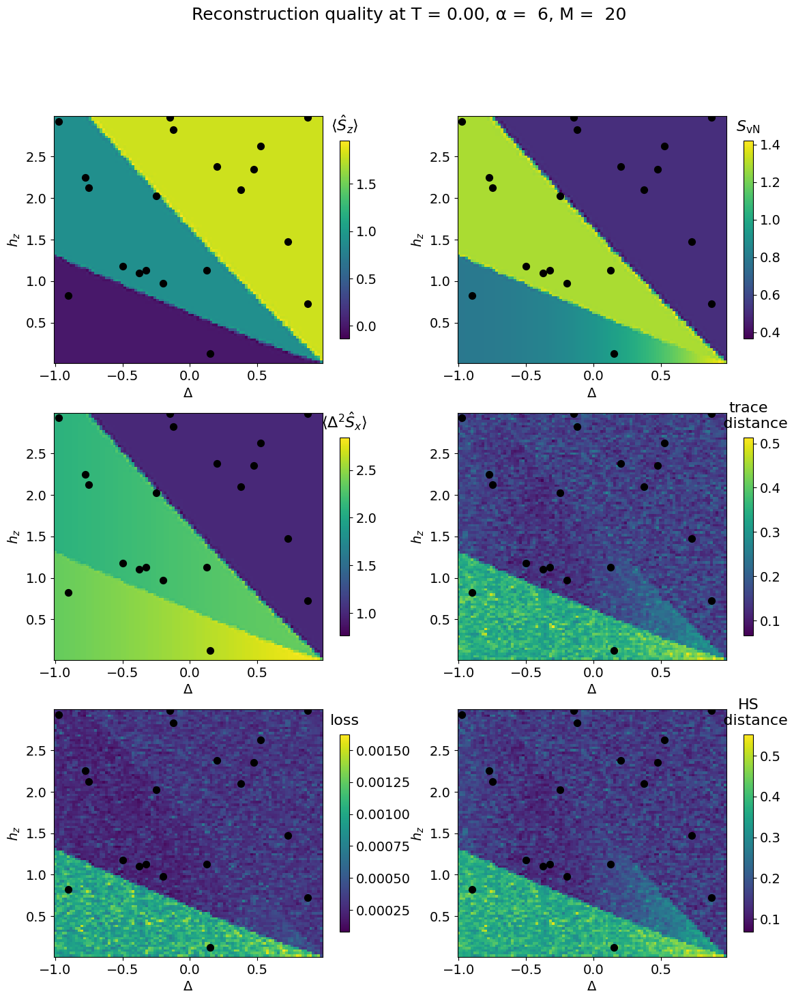

(9520, 150)


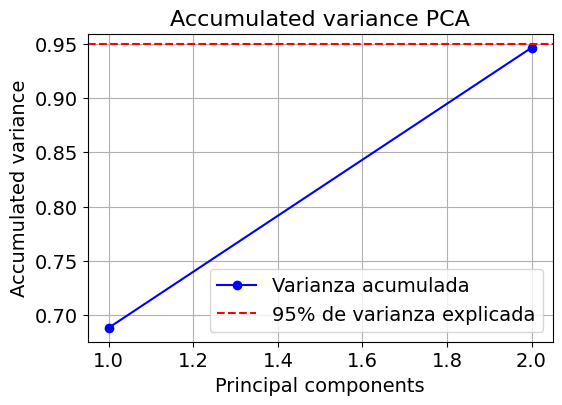

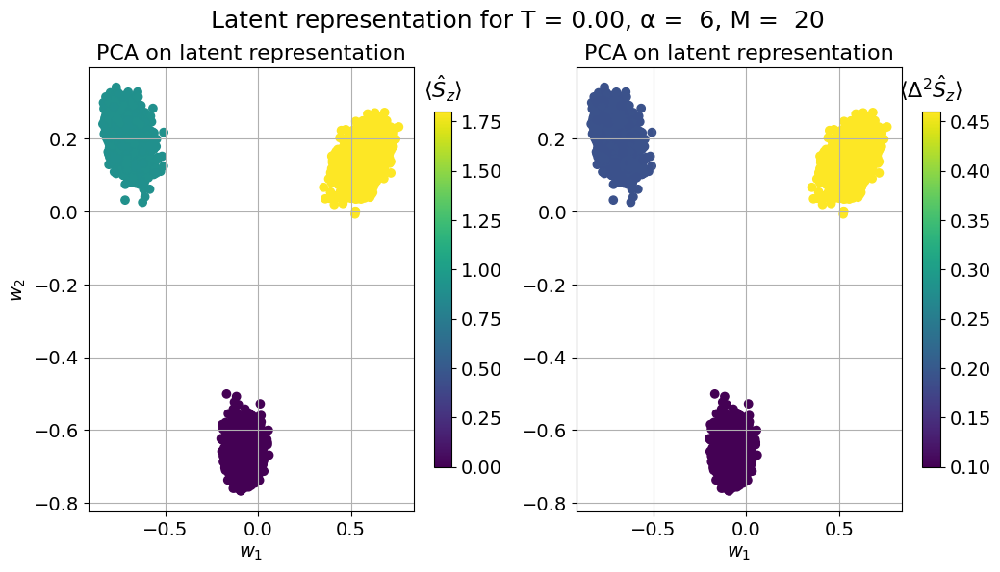

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0042
Epoch [11/100], Loss: 0.0022
Epoch [21/100], Loss: 0.0009
Epoch [31/100], Loss: 0.0008
Epoch [41/100], Loss: 0.0004
Epoch [51/100], Loss: 0.0004
Epoch [61/100], Loss: 0.0002
Epoch [71/100], Loss: 0.0003
Epoch [81/100], Loss: 0.0002
Epoch [91/100], Loss: 0.0002
Done ...


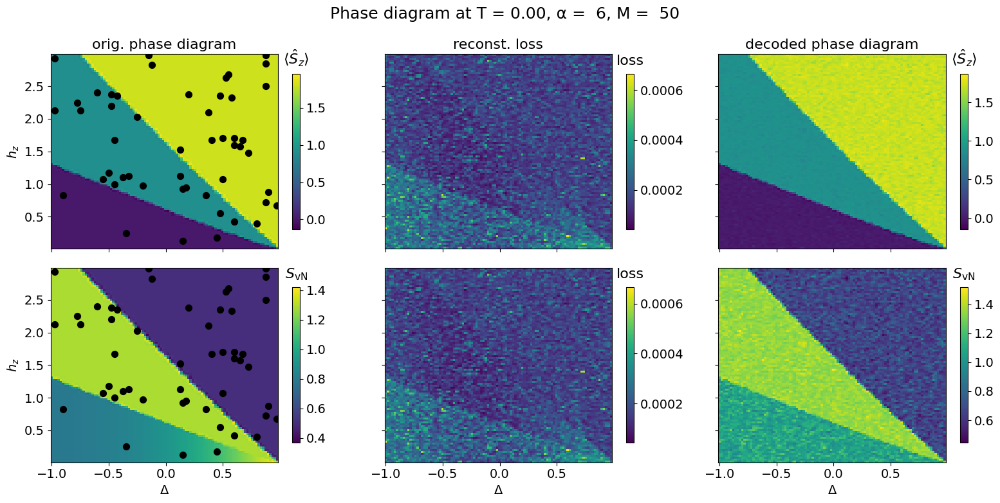

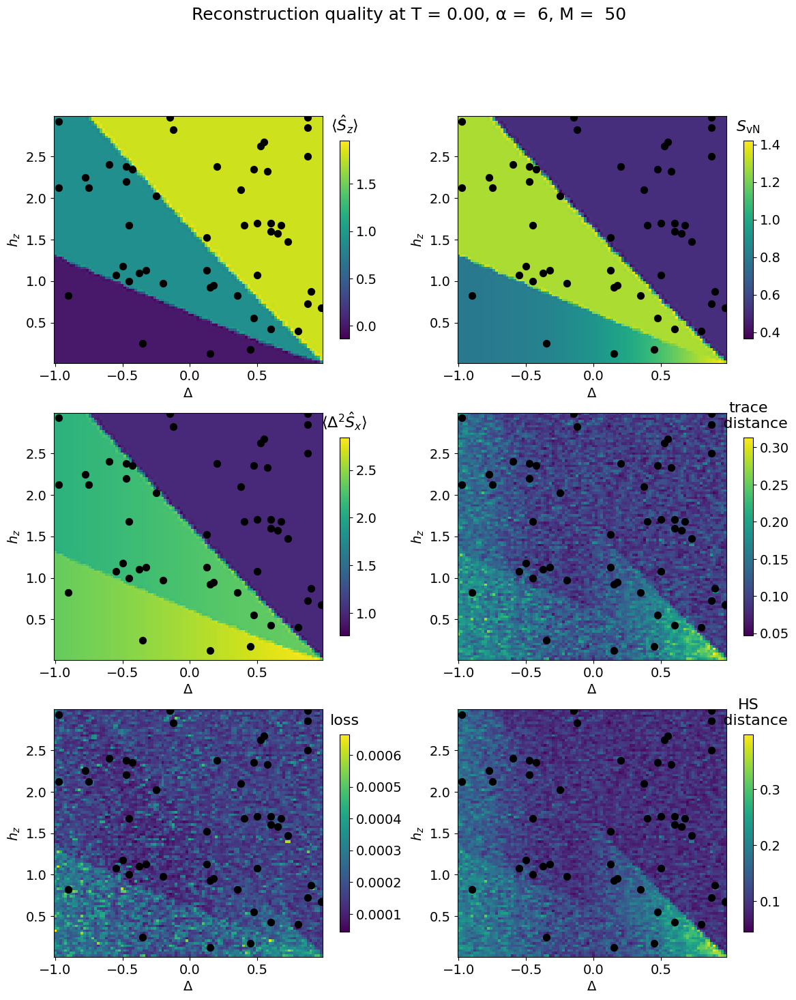

(9520, 150)


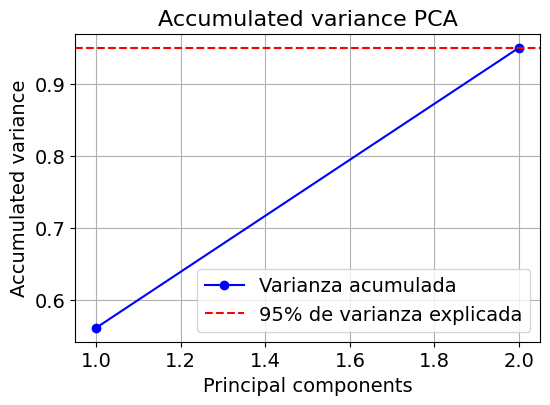

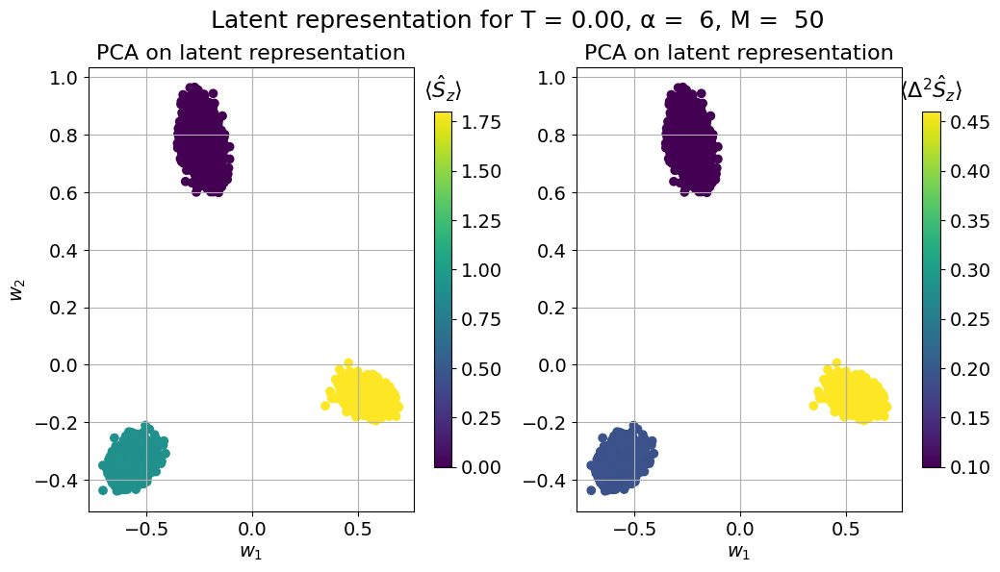

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0043
Epoch [11/100], Loss: 0.0009
Epoch [21/100], Loss: 0.0004
Epoch [31/100], Loss: 0.0003
Epoch [41/100], Loss: 0.0003
Epoch [51/100], Loss: 0.0002
Epoch [61/100], Loss: 0.0002
Epoch [71/100], Loss: 0.0001
Epoch [81/100], Loss: 0.0001
Epoch [91/100], Loss: 0.0001
Done ...


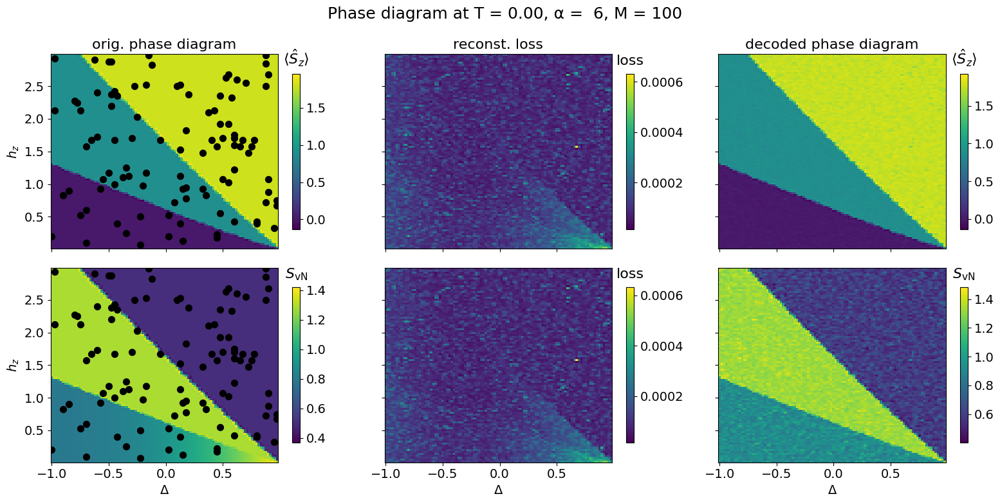

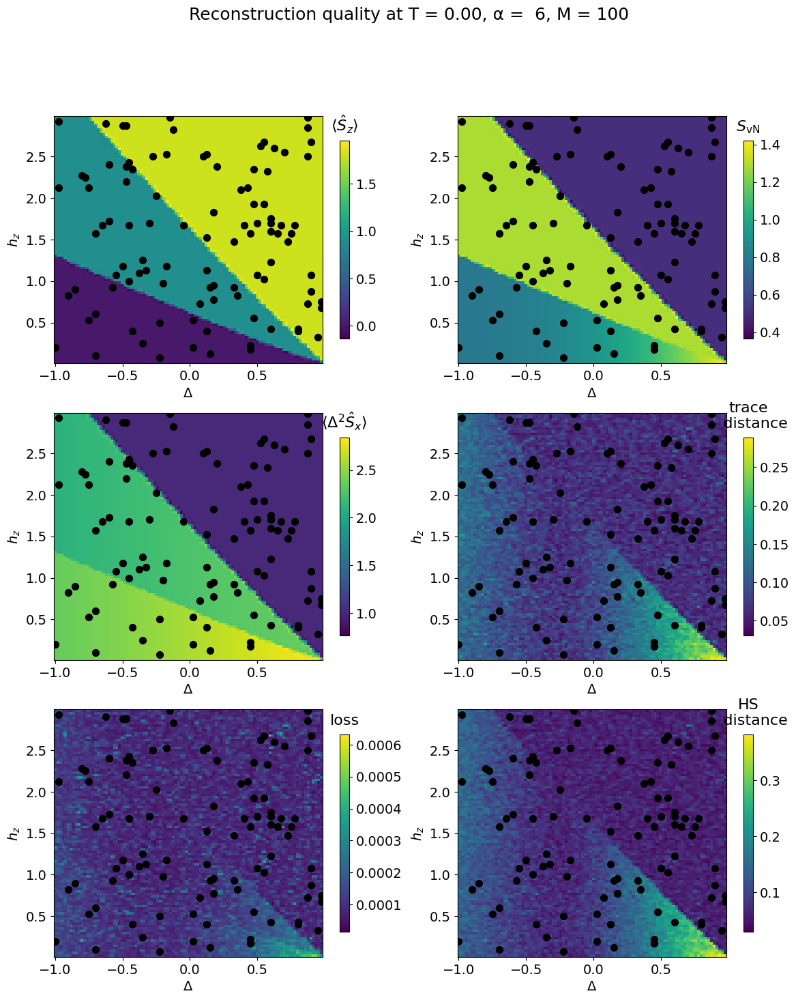

(9520, 150)


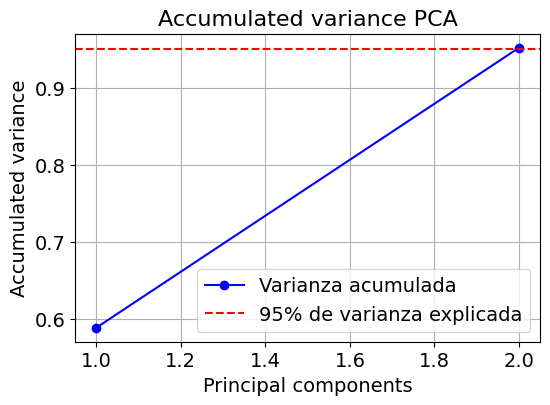

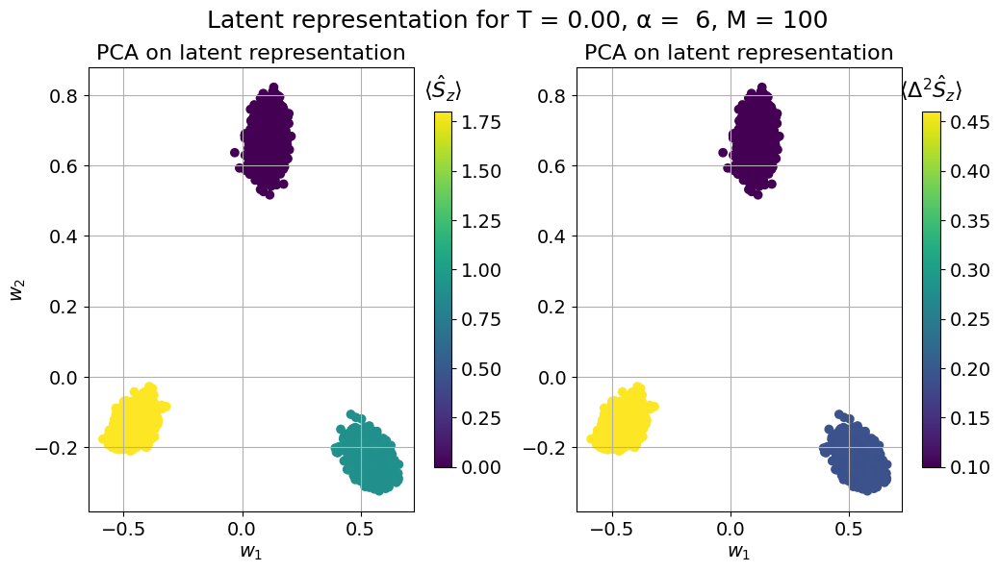

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0036
Epoch [11/100], Loss: 0.0003
Epoch [21/100], Loss: 0.0002
Epoch [31/100], Loss: 0.0001
Epoch [41/100], Loss: 0.0001
Epoch [51/100], Loss: 0.0001
Epoch [61/100], Loss: 0.0001
Epoch [71/100], Loss: 0.0001
Epoch [81/100], Loss: 0.0000
Epoch [91/100], Loss: 0.0001
Done ...


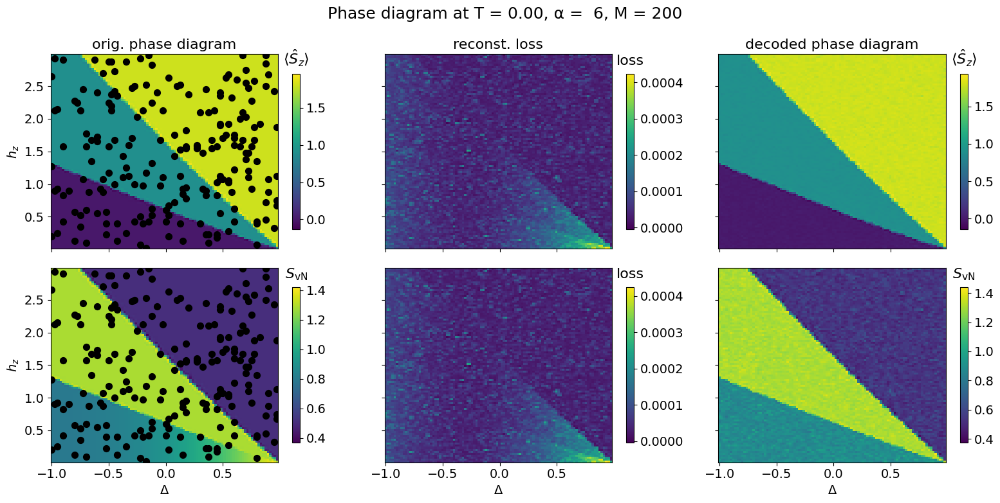

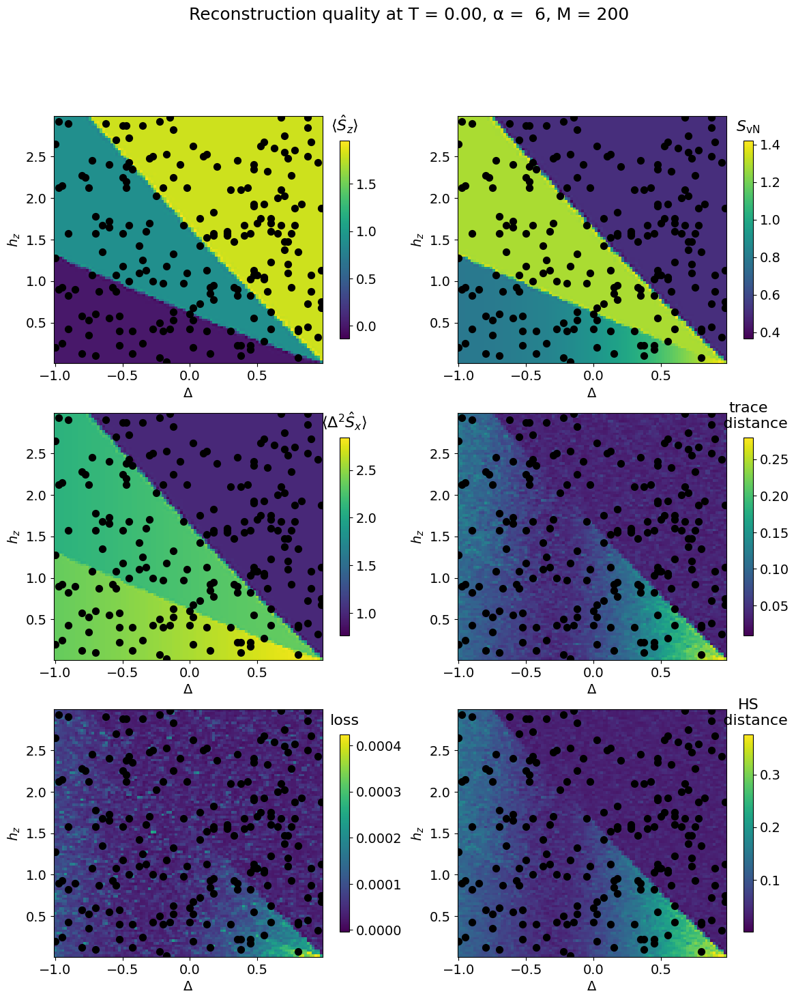

(9520, 150)


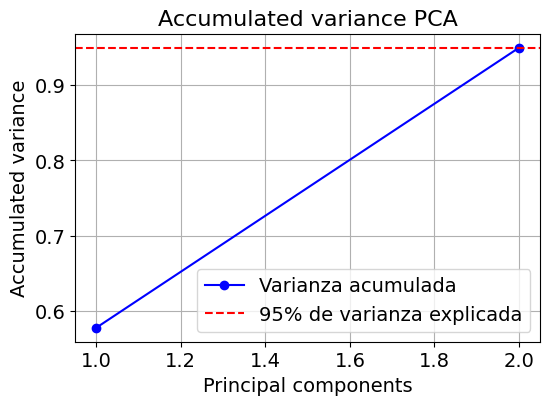

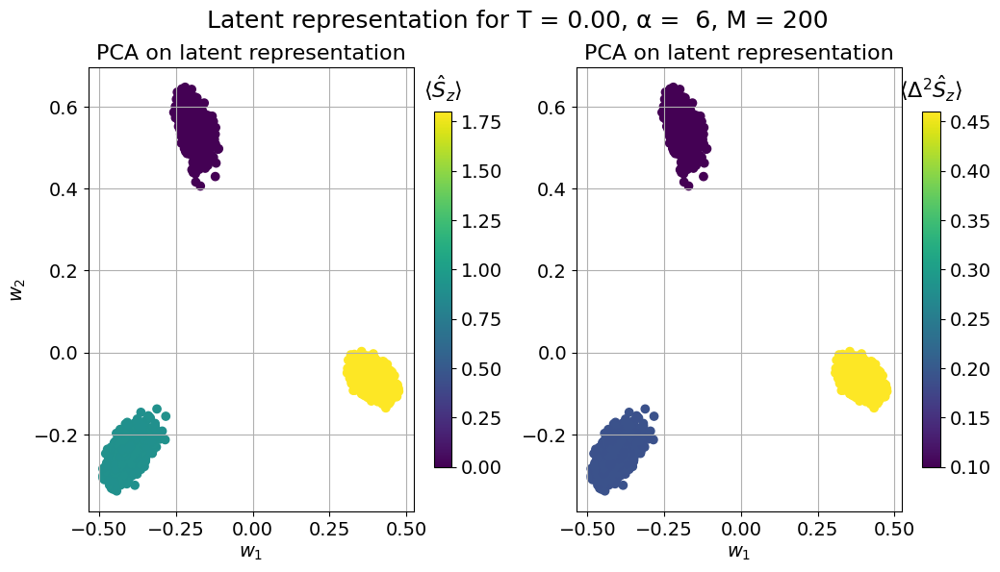

In [ ]:
# For range of M values
M = np.array([1,2,10,20,50,100,200])

for n in M:
    df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(n,df_all_alpha6)
    df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_alpha6)
    plot_autoencoder(df_all_decoded, df_sample, 0, 6, n)
    distances(df_all_decoded, df_sample, 0, 6, n)
    latent_repr(df_all_decoded, 0, 6, n)




In [ ]:
L_values = [4]

#Define Pauli matrices


delta_values = np.arange(-1.0, 1.0, 0.01)
hz_values = np.arange(0, 3, 0.01)
alpha_values = np.array([0,3,6])
T_values = np.array([0.05, 0.1, 1])
alpha=6
for L in L_values:
    data = []
    dim = 2**L

    hxxz=nk.hilbert.Spin(s=1 / 2, N=L)
    sigmax_i= [ sigmax(hxxz,i).to_dense() for i in range(L)]
    sigmay_i= [ sigmay(hxxz,i).to_dense() for i in range(L)]
    sigmaz_i= [ sigmaz(hxxz,i).to_dense() for i in range(L)]

    Sx,Sy,Sz= getSx(hxxz), getSy(hxxz), getSz(hxxz)


    for delta in tqdm(delta_values):
            for hz in hz_values:
                if(delta !=0 and hz !=0):
                    for T in T_values:
                        H = create_hamiltonian(hxxz, delta, hz, alpha)
                        rho_eigenbasis, rho = get_Gibbs_state(H, T)
                        epsilon = 1e-1
                        rho = (1-epsilon)*rho + epsilon*np.eye(dim)/dim
                        _, SvN = get_entropy_bipartite(rho,L)

                        A = cholesky(rho, lower=True)
                        A_vec = cholesky_matrix_to_cholesky_vector(A)

                        # Compute expectation values of total spin operators
                        E = np.trace(H @ rho).real
                        tempX=Sx@rho
                        tempY=Sy@rho
                        tempZ=Sz@rho

                        Sx_exp = np.trace(tempX).real
                        Sy_exp = np.trace(tempY).real
                        Sz_exp = np.trace(tempZ).real

                        Sx_var_exp = np.trace(Sx @ tempX).real - np.abs(Sx_exp)**2
                        Sy_var_exp = np.trace(Sy @ tempY).real - np.abs(Sy_exp)**2
                        Sz_var_exp = np.trace(Sz @ tempZ).real - np.abs(Sz_exp)**2



                        data.append({
                            "L"         : L,
                            "delta"     : delta,
                            "alpha"     : alpha,
                            "hz"        : hz,
                            "T"         : T,
                            "SvN"       : SvN,
                            "E"         : E,
                            "Sx"        : Sx_exp,
                            "Sy"        : Sy_exp,
                            "Sz"        : Sz_exp,
                            "Sx_var"    : Sx_var_exp,
                            "Sy_var"    : Sy_var_exp,
                            "Sz_var"    : Sz_var_exp,
                            "A_vec"     : A_vec,
                        })
df_all_T = pd.DataFrame(data)
 # Remove any rows where the 'A_vec' has a near‑zero norm.
df_all_T = df_all_T[df_all_T['A_vec'].apply(lambda v: np.linalg.norm(v) > 1e-10)]

100%|██████████| 200/200 [02:30<00:00,  1.33it/s]


In [ ]:
#Split data
alpha = 6
df_all_T005 = df_all_T[df_all_T["T"] == 0.05]
df_all_T01 = df_all_T[df_all_T["T"] == 0.1]
df_all_T1 = df_all_T[df_all_T["T"] == 1]


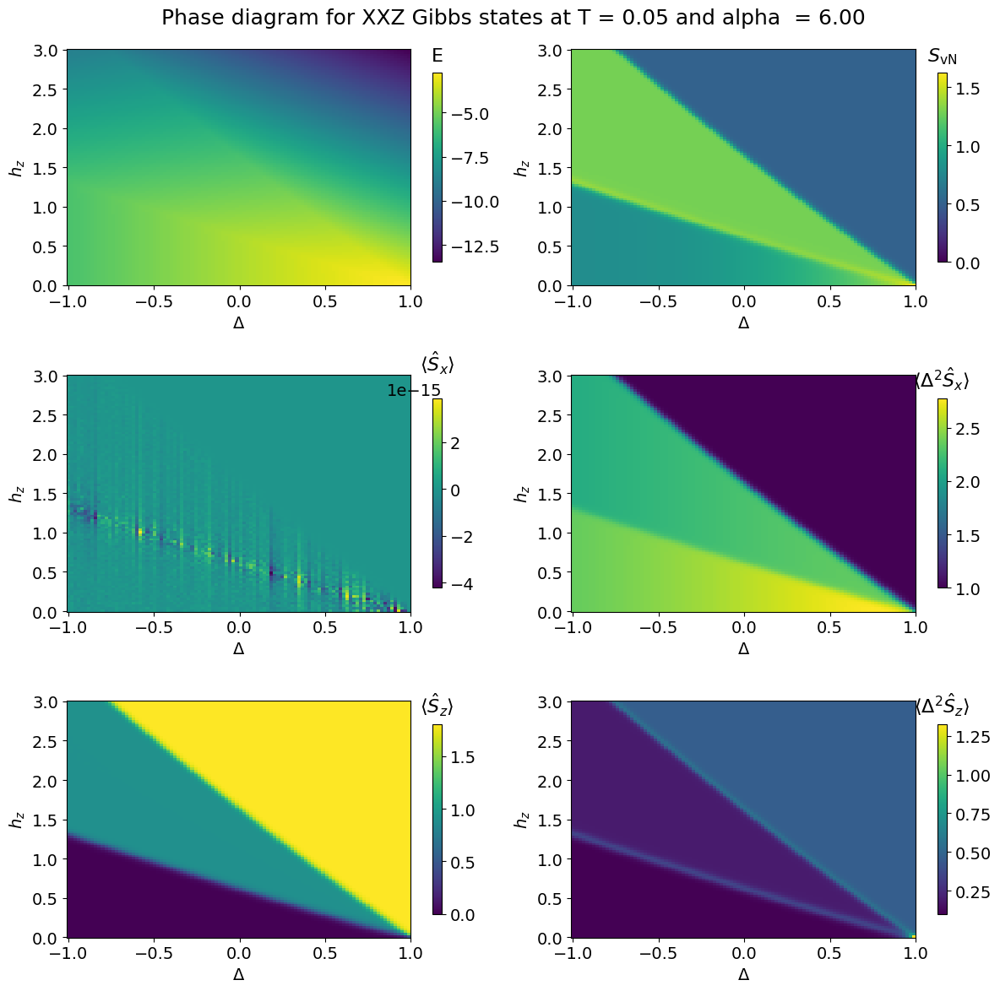

<ipython-input-184-eda387ffeb91>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-184-eda387ffeb91>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]


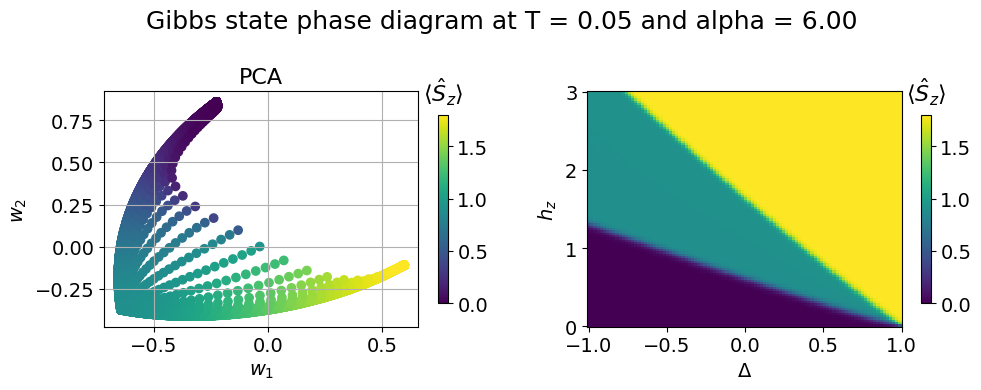

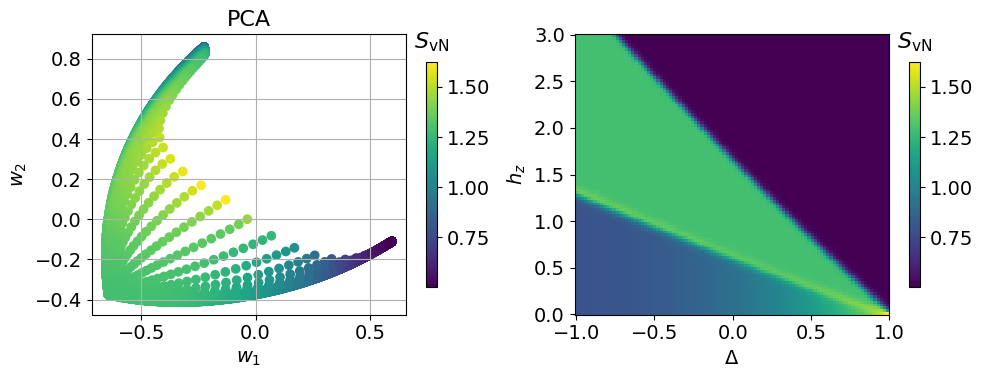

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0039
Epoch [11/100], Loss: 0.0023
Epoch [21/100], Loss: 0.0007
Epoch [31/100], Loss: 0.0004
Epoch [41/100], Loss: 0.0003
Epoch [51/100], Loss: 0.0003
Epoch [61/100], Loss: 0.0003
Epoch [71/100], Loss: 0.0002
Epoch [81/100], Loss: 0.0002
Epoch [91/100], Loss: 0.0002
Done ...


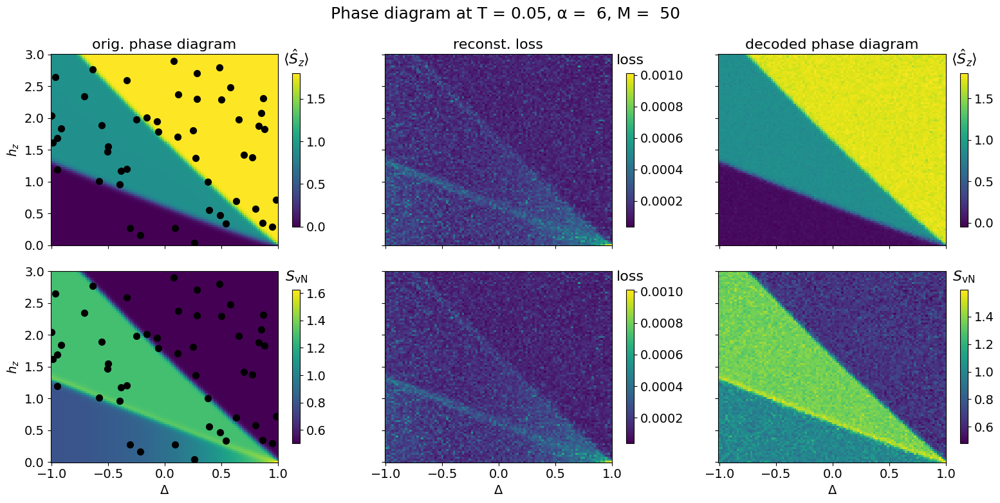

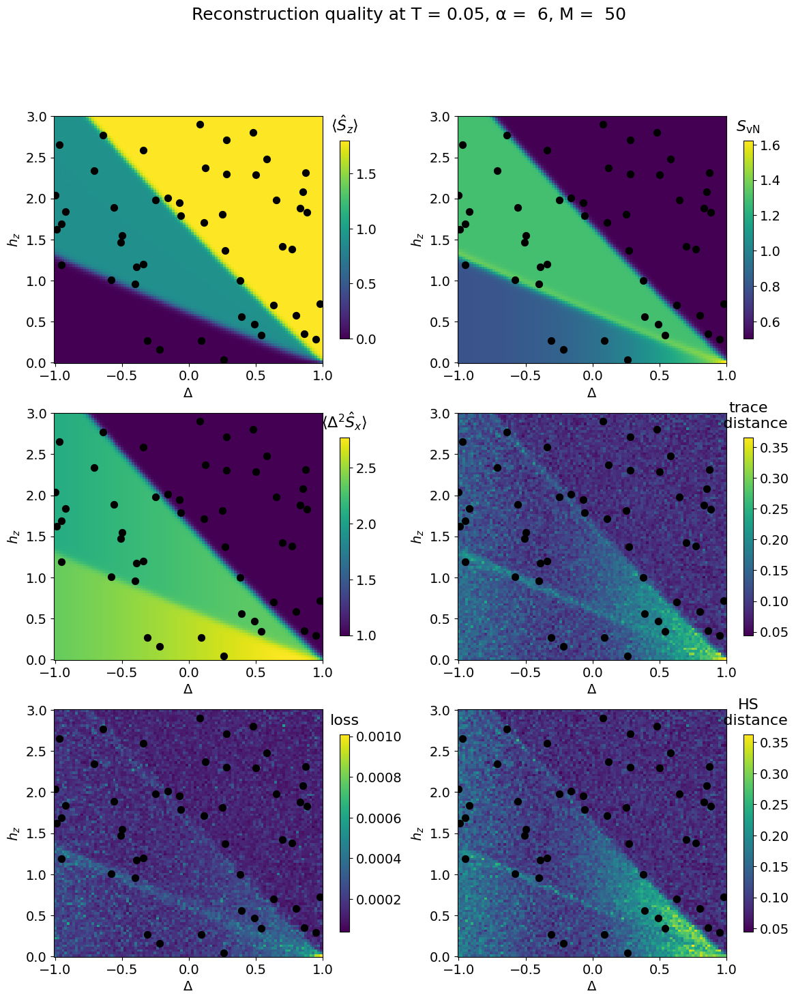

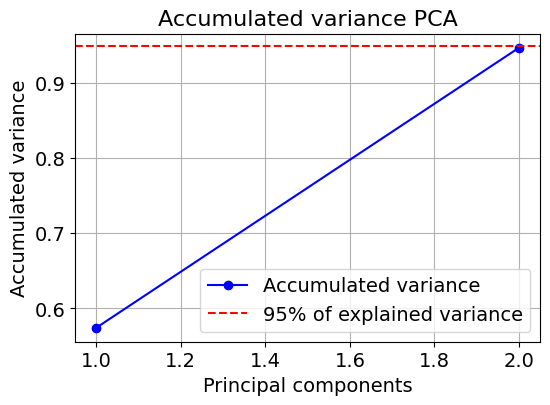

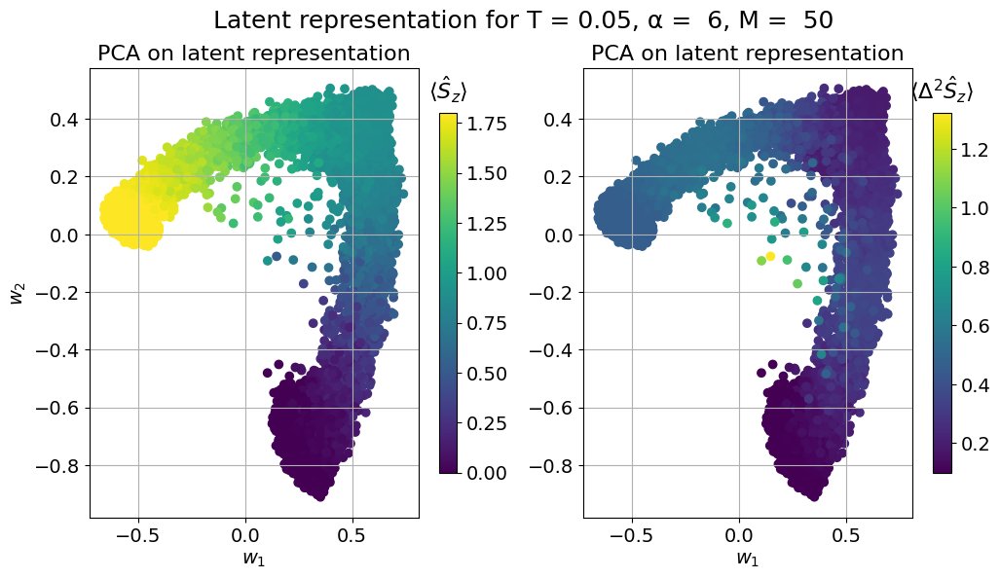

In [ ]:
T = 0.05
plot_phase_diagram(df_all_T005, alpha)
PCA_tSNE(df_all_T005, alpha,is0=False)

M = 50
df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(M,df_all_T005)
df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_T005)
plot_autoencoder(df_all_decoded, df_sample, T, 6, M)
distances(df_all_decoded, df_sample, T, 6, M)
latent_repr(df_all_decoded, T, 6, M)


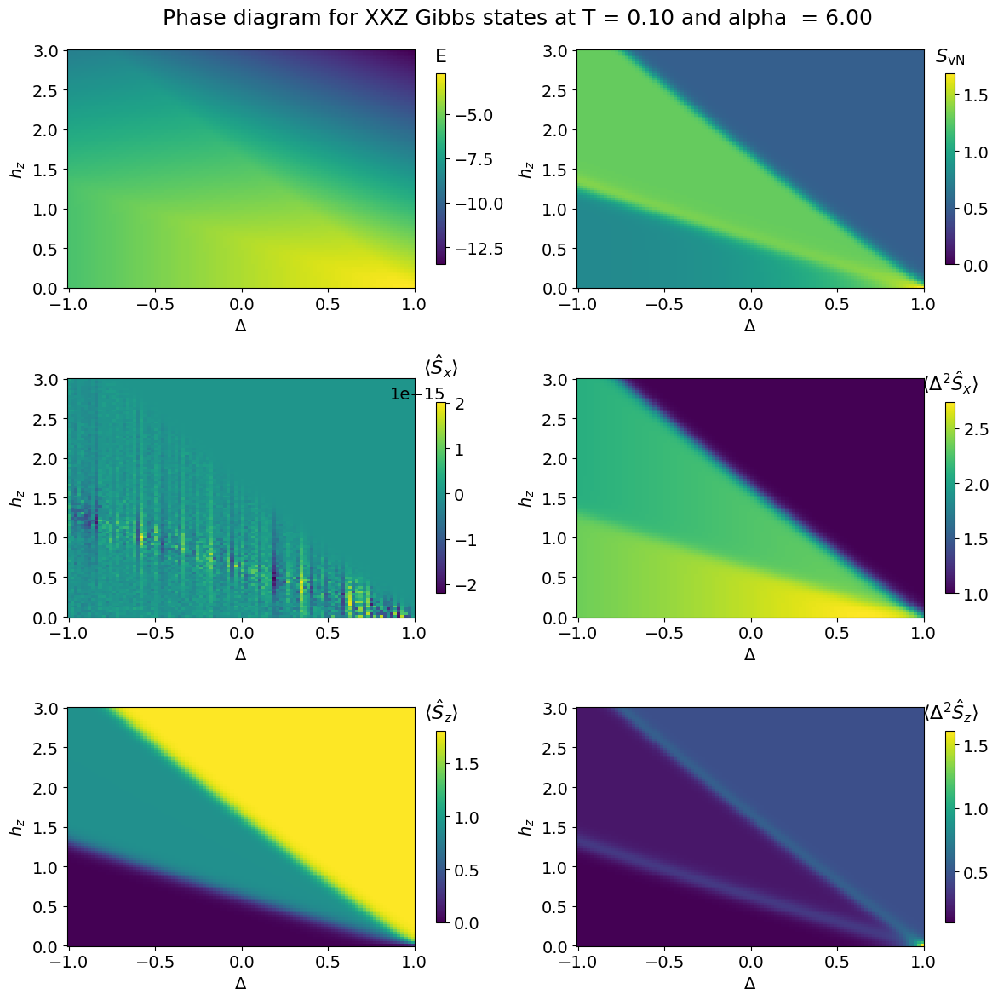

<ipython-input-184-eda387ffeb91>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-184-eda387ffeb91>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]


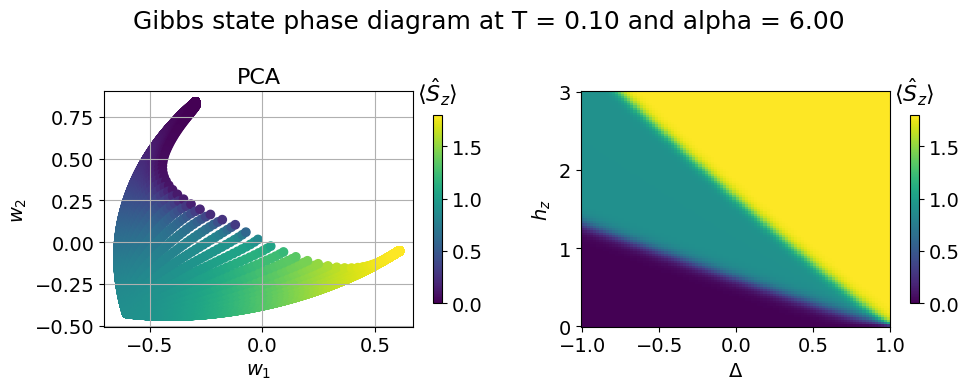

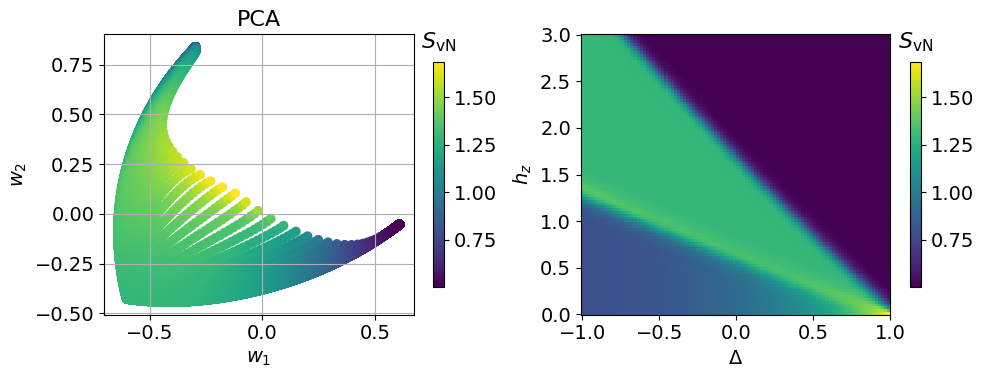

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0047
Epoch [11/100], Loss: 0.0037
Epoch [21/100], Loss: 0.0029
Epoch [31/100], Loss: 0.0018
Epoch [41/100], Loss: 0.0011
Epoch [51/100], Loss: 0.0014
Epoch [61/100], Loss: 0.0010
Epoch [71/100], Loss: 0.0008
Epoch [81/100], Loss: 0.0005
Epoch [91/100], Loss: 0.0006
Done ...


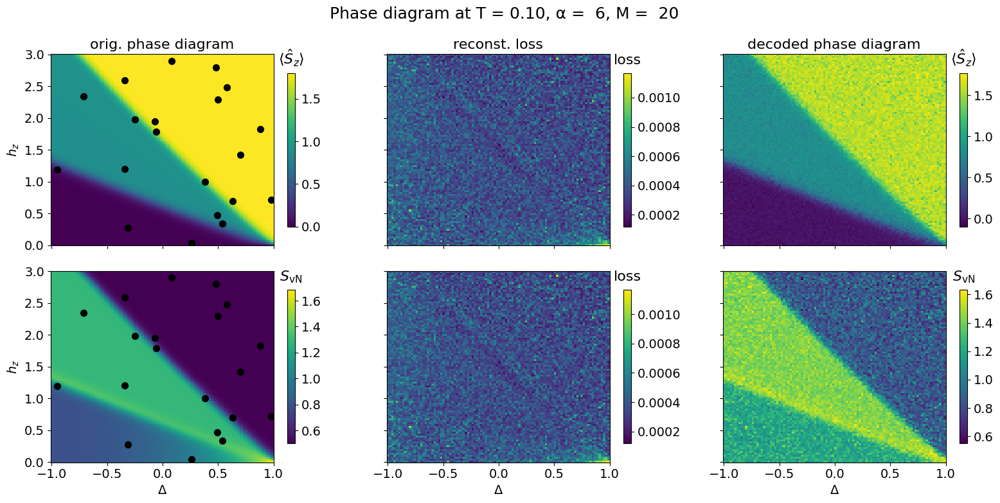

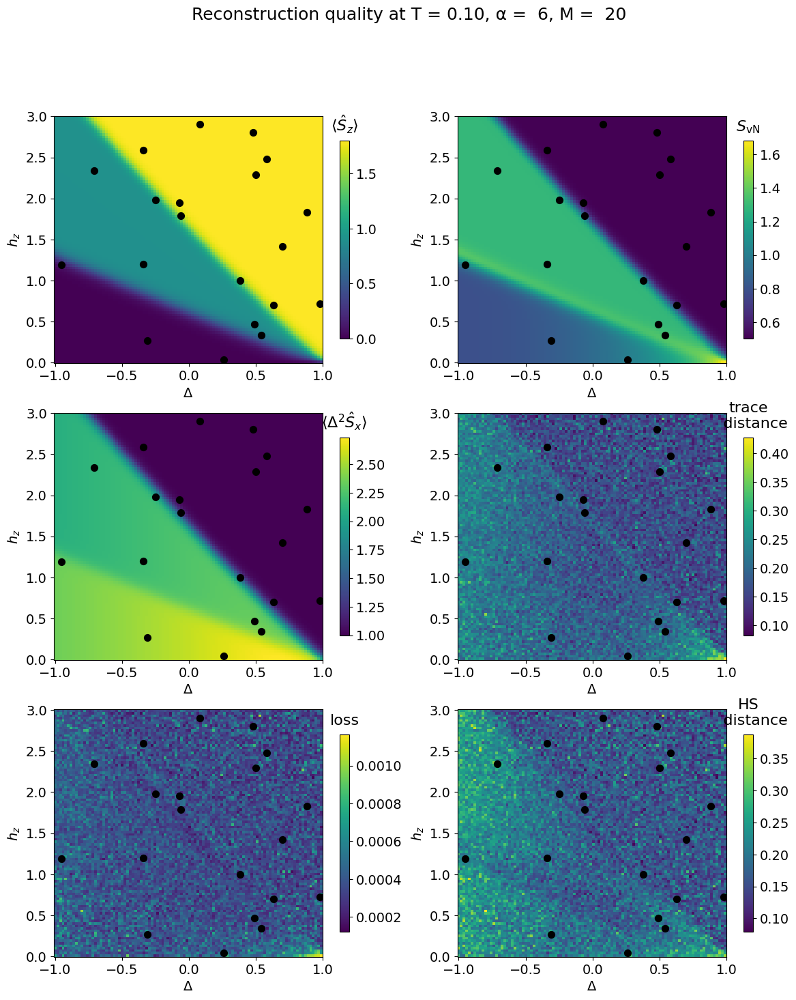

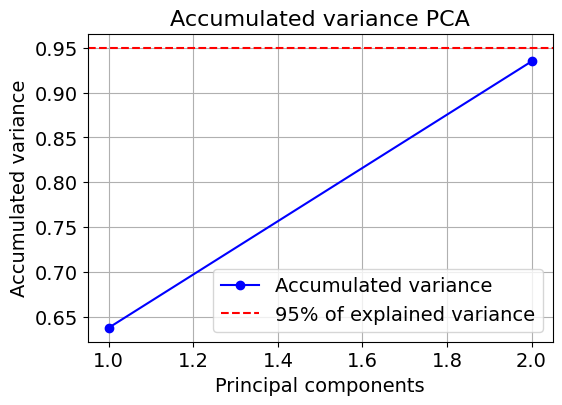

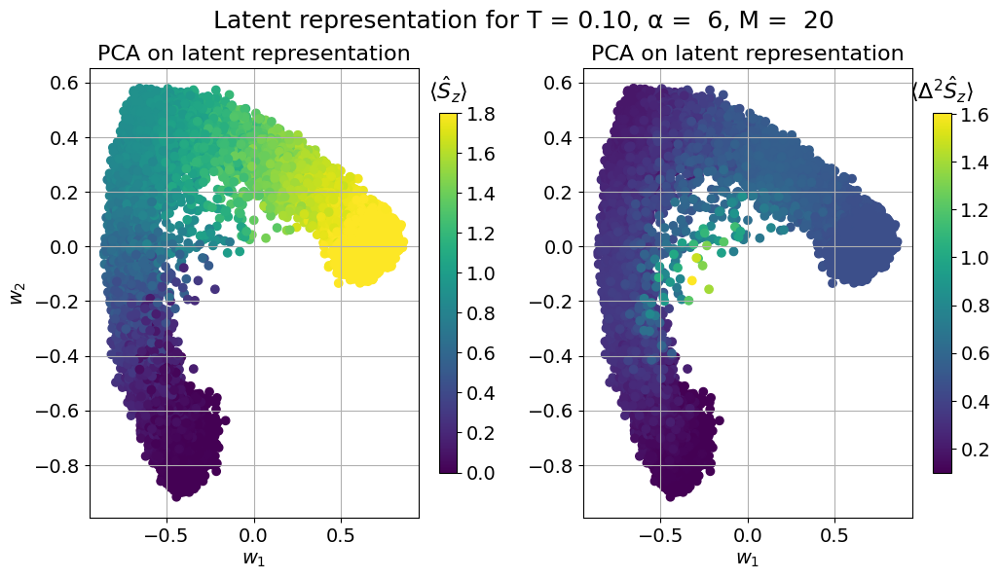

In [ ]:
T=0.1
plot_phase_diagram(df_all_T01, alpha)
PCA_tSNE(df_all_T01, alpha, False)

M = 20
df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(M,df_all_T01)
df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_T01)
plot_autoencoder(df_all_decoded, df_sample, T, 6, M)
distances(df_all_decoded, df_sample, T, 6, M)
latent_repr(df_all_decoded, T, 6, M)

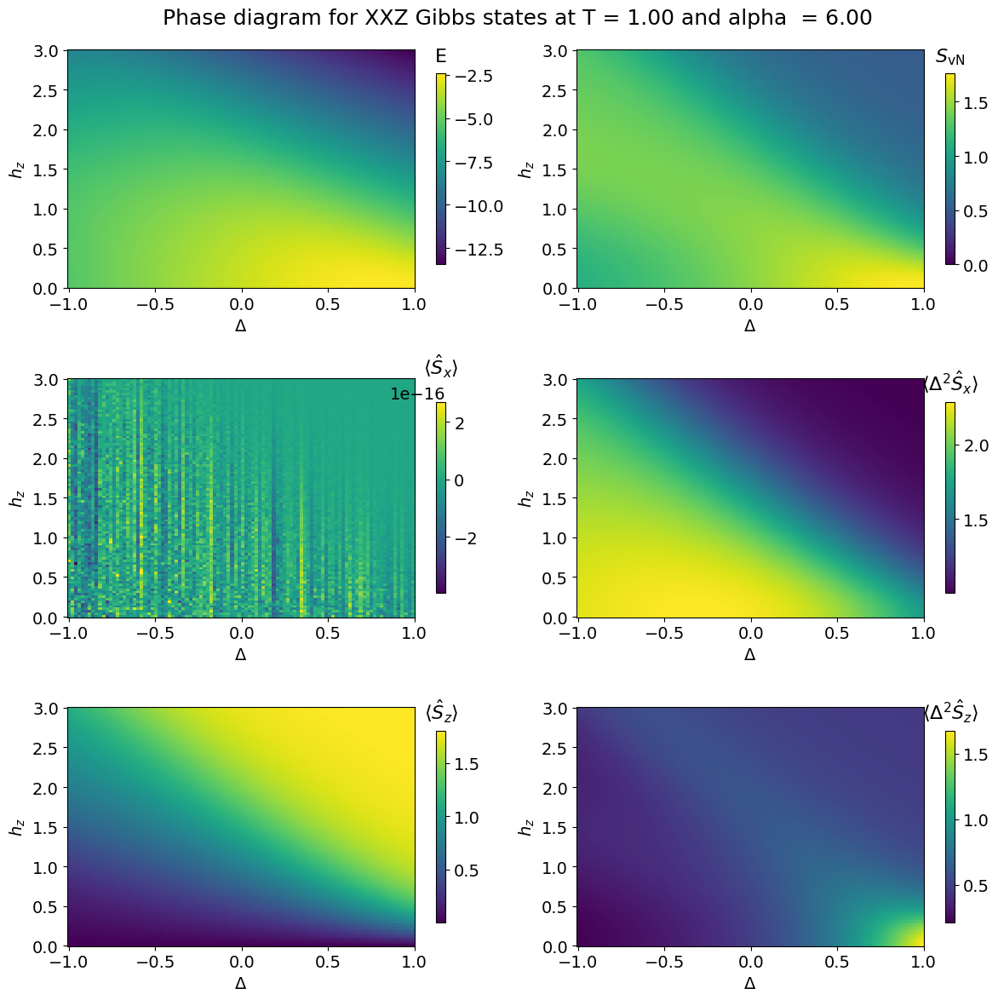

<ipython-input-184-eda387ffeb91>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA1'] = reduced_data[:, 0]
<ipython-input-184-eda387ffeb91>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['PCA2'] = reduced_data[:, 1]


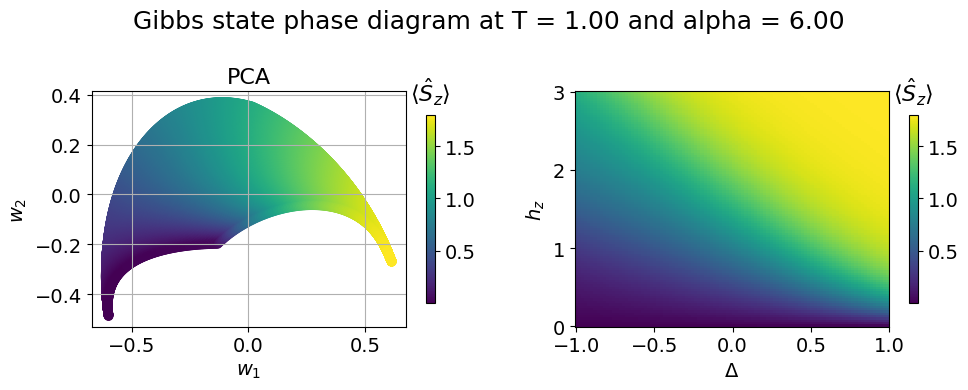

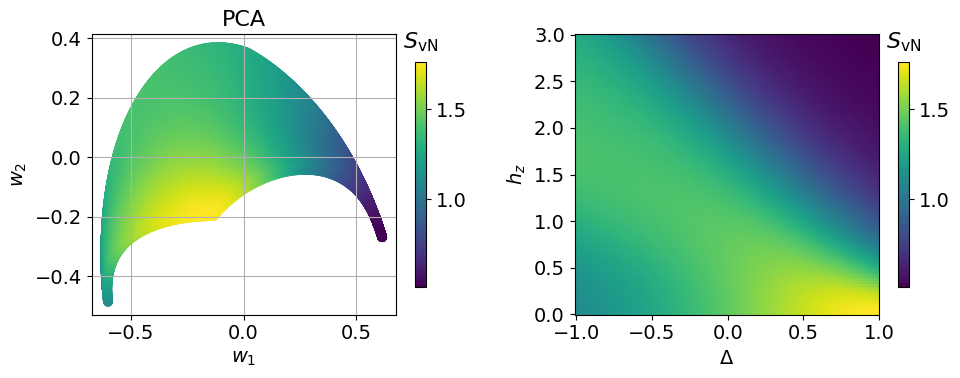

Autoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=272, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=150, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
  (decoder): Sequential(
    (0): Linear(in_features=150, out_features=200, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.2, inplace=False)
    (3): Linear(in_features=200, out_features=272, bias=True)
    (4): LeakyReLU(negative_slope=0.3)
  )
)
Training the autoencoder...
Epoch [1/100], Loss: 0.0045
Epoch [11/100], Loss: 0.0030
Epoch [21/100], Loss: 0.0012
Epoch [31/100], Loss: 0.0009
Epoch [41/100], Loss: 0.0010
Epoch [51/100], Loss: 0.0007
Epoch [61/100], Loss: 0.0009
Epoch [71/100], Loss: 0.0007
Epoch [81/100], Loss: 0.0006
Epoch [91/100], Loss: 0.0003
Done ...


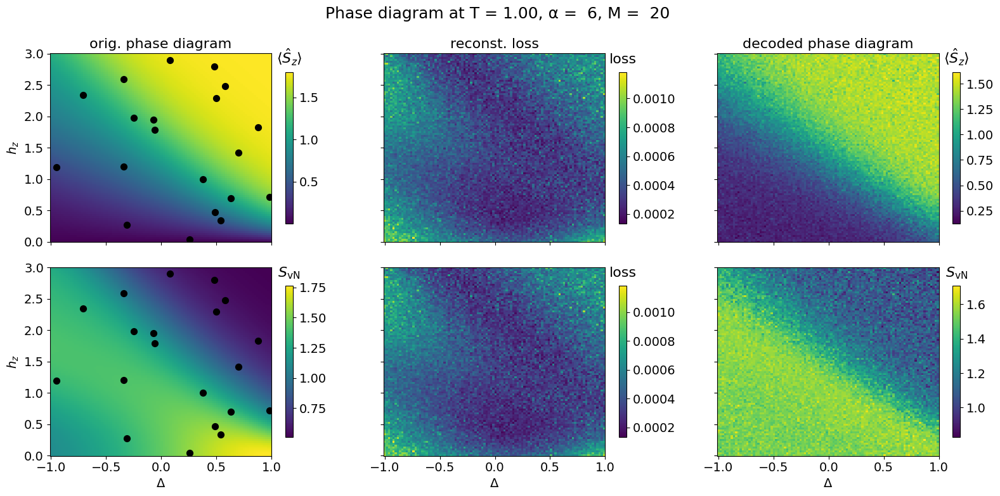

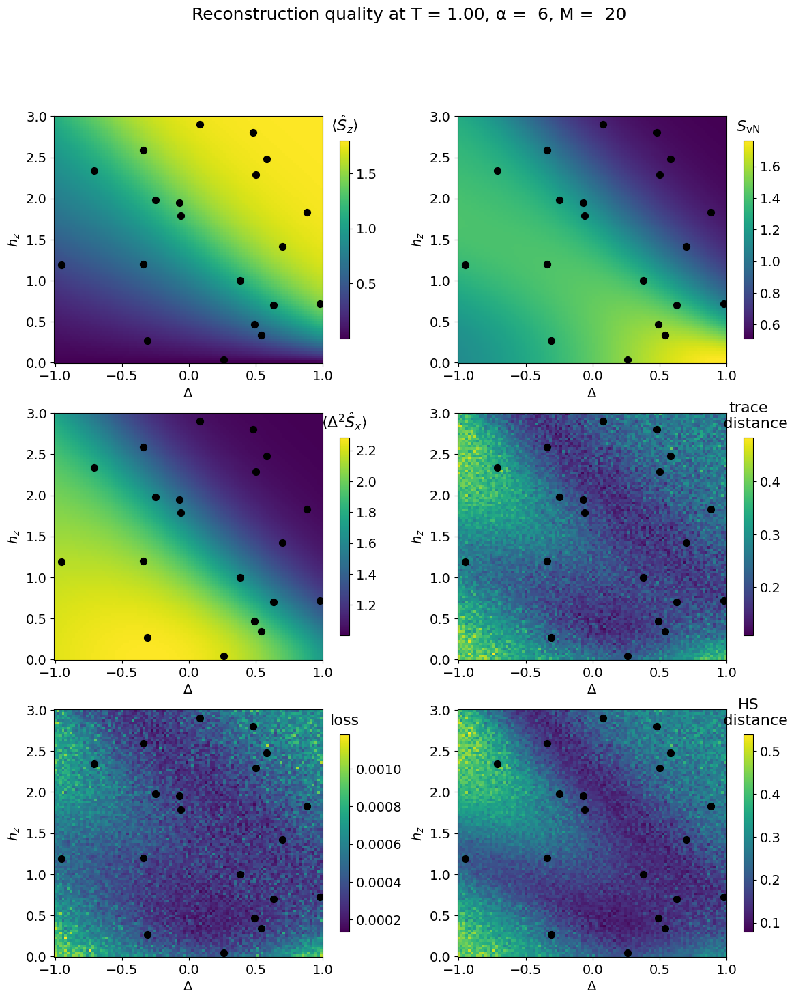

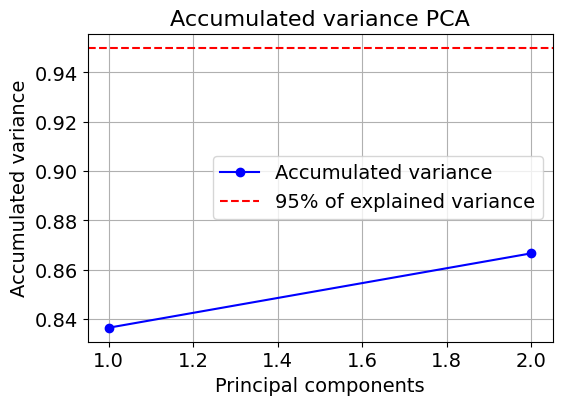

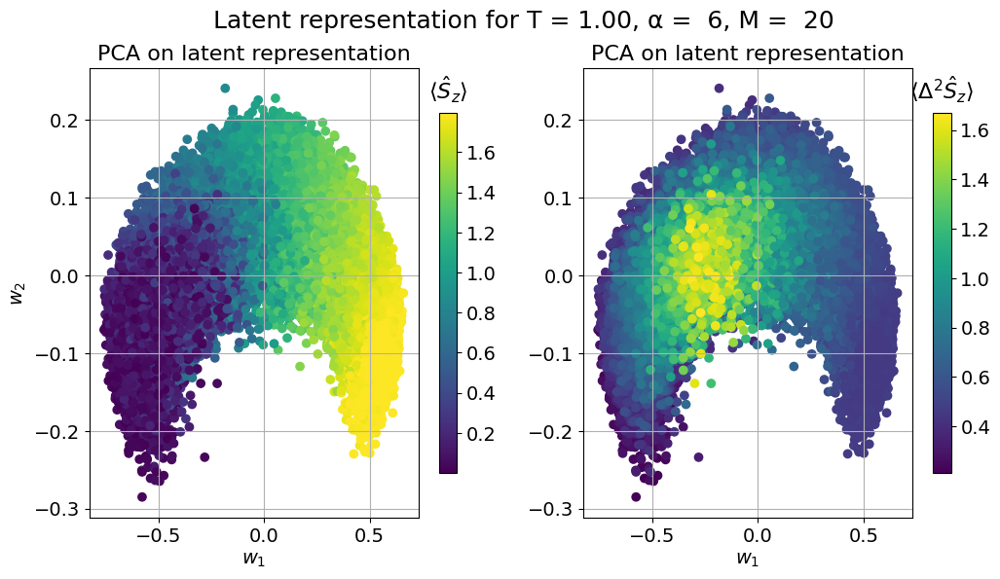

In [ ]:
T=1.0
plot_phase_diagram(df_all_T1, alpha)
PCA_tSNE(df_all_T1, alpha, is0=False)

M = 20
df_sample, X, X_tensor, input_dim, hidden_dim1, bottleneck = configure_autoencoder(M,df_all_T1)
df_all_decoded = train_autoencoder(input_dim, hidden_dim1, bottleneck, X_tensor, df_all_T1)
plot_autoencoder(df_all_decoded, df_sample, T, 6, M)
distances(df_all_decoded, df_sample, T, 6, M)
latent_repr(df_all_decoded, T, 6, M)

Se han truncado las últimas 5000 líneas del flujo de salida.
-0.12021802459163651 1.998
-0.10939492373105128 1.998
-0.3069865235410955 1.998
-0.03705738562225547 1.998
-0.13049759094000687 1.998
-0.24146908028918584 1.998
-0.12842533024988995 1.998
-0.22347383522096542 1.998
-0.2819422989860241 1.998
-0.10023727275292385 1.998
-0.17361265715883584 1.998
-0.06444779561306446 1.998
-0.15043210656771733 1.998
-0.10266867941860292 1.998
-0.136276498687595 1.998
-0.147242795914293 1.998
-0.1970926258654187 1.998
-0.035186833955723695 1.998
-0.1550419246514404 1.998
-0.13940544787412815 1.998
-0.1298661452764176 1.998
-0.2433574847954947 1.998
-0.14815494703668222 1.998
-0.19634789704566424 1.998
-0.22963771530217789 1.998
-0.2074595686349831 1.998
-0.20270363781897505 1.998
-0.014624249757289709 1.998
-0.20796861142141965 1.998
-0.15231448048940283 1.998
-0.2016627328668294 1.998
-0.21264308546442187 1.998
-0.12832319085822008 1.998
-0.2572423118094485 1.998
-0.07980361015618115 1.998
-0.06